In [1]:
# Installing the necessary libraries here
import matplotlib as mpl
from matplotlib import colors

%matplotlib inline
mpl.rcParams['figure.figsize'] = (15, 10) #this increases the inline figure size to 15 tall x 10 wide

import seaborn
import pandas as pd
import geopandas as gpd
import pysal
import numpy as np
import mapclassify
import matplotlib.pyplot as plt

import contextily as cx
from shapely.geometry import Polygon
import plotly.express as px
from pysal.explore import esda
from pysal.lib import weights
from splot.esda import plot_moran
from splot.esda import moran_scatterplot
from splot.esda import plot_local_autocorrelation
from splot.esda import lisa_cluster
from esda.moran import Moran_Local

import warnings
warnings.filterwarnings('ignore') # Change settings so that warnings are not displayed
# Loading a few new packages
from scipy import stats
from pysal.model import spreg
import statsmodels.formula.api as sm

C:\Users\Naveen\anaconda3\envs\geo_env\lib\site-packages\spaghetti\network.py:36: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(f"{dep_msg}", FutureWarning)


In [2]:
# Questions
# What is 2011 housing points dataset, london open source, london output area boundaries, primary roads, london transit stations
# Where can we find description of london houseprices dataset
# Is the houseprice in the boroughs data median? if so how is it calculated?

Loading all the housing points data

In [3]:
hp = gpd.read_file('C:\\Users\\Naveen\\Downloads\\data_daproj\\houses_lr.geojson')
# Adding index for further analysis
hp['ID'] = hp.index+1
hp.head()

,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,numberrooms,priceper,pcd,pcd2,dointr,doterm,geometry,ID
0,CR53EZ,795000.0,2012-03-15,D,Y,F,A,A,2012.0,250.0,7.0,3180.000000,CR5 3EZ,CR5 3EZ,201107.0,NaN,POINT (528925.000 157964.000),1
1,CR53EZ,1250000.0,2015-12-18,D,N,F,A,A,2015.0,279.0,9.0,4480.286738,CR5 3EZ,CR5 3EZ,201107.0,NaN,POINT (528925.000 157964.000),2
2,CR53EZ,1000000.0,2011-12-22,D,Y,F,A,A,2011.0,302.0,9.0,3311.258278,CR5 3EZ,CR5 3EZ,201107.0,NaN,POINT (528925.000 157964.000),3
3,CR53EZ,970000.0,2015-12-04,D,N,F,A,A,2015.0,272.0,9.0,3566.176471,CR5 3EZ,CR5 3EZ,201107.0,NaN,POINT (528925.000 157964.000),4
4,CR53EZ,995000.0,2016-10-18,D,N,F,A,A,2016.0,288.0,7.0,3454.861111,CR5 3EZ,CR5 3EZ,201107.0,NaN,POINT (528925.000 157964.000),5


Loading all the borough boundaries

In [4]:
profiles = pd.read_csv('C:\\Users\\Naveen\\Downloads\\data_daproj\\lb_profiles.csv')
lb = gpd.read_file('C:\\Users\\Naveen\\Downloads\\data_daproj\\london_boroughs.geojson')
lb_map = lb.merge(profiles)

In [5]:
lb_map['br_ID'] = lb_map.index+1

In [6]:
hp.describe()

,price,year,tfarea,numberrooms,priceper,dointr,doterm,ID
count,6.411890e+05,641189.000000,641189.000000,641189.000000,641189.000000,641189.000000,284.000000,641189.000000
mean,5.239104e+05,2014.657419,88.467389,4.137348,5769.170121,198301.482688,201604.299296,320595.000000
std,6.004618e+05,2.405846,46.366139,1.710571,3218.960272,718.523425,149.624448,185095.465213
min,1.000000e+04,2011.000000,10.000000,1.000000,256.529851,198001.000000,200810.000000,1.000000
25%,2.700000e+05,2013.000000,60.000000,3.000000,3753.181818,198001.000000,201611.000000,160298.000000
50%,3.850000e+05,2014.000000,78.570000,4.000000,5000.000000,198001.000000,201611.000000,320595.000000
75%,5.750000e+05,2017.000000,103.000000,5.000000,6843.952484,198001.000000,201611.000000,480892.000000
max,3.772000e+07,2019.000000,959.740000,20.000000,50000.000000,202004.000000,201912.000000,641189.000000


In [7]:
hp.crs = lb.crs
hp1 = gpd.sjoin(hp,lb_map)
hp1.describe()
# There are a few points which could not be marked

,price,year,tfarea,numberrooms,priceper,dointr,doterm,ID,index_right,HECTARES,...,Unemp,Disabled,Degrees,MedInc,CrimeRate,HousePrice,GreenSpace,CarsHH,NonEng,br_ID
count,6.411390e+05,641139.000000,641139.000000,641139.000000,641139.000000,641139.000000,284.000000,641139.000000,641139.000000,641139.000000,...,640067.000000,640067.000000,640067.000000,641139.000000,640067.000000,6.411390e+05,641139.000000,641139.000000,640067.000000,641139.000000
mean,5.238969e+05,2014.657421,88.467390,4.137404,5769.060206,198301.430092,201604.299296,320581.962258,14.222799,5584.141298,...,6.030468,15.861487,49.824921,39234.280413,81.325178,4.395256e+05,34.084901,0.866874,44.532366,15.222799
std,6.004449e+05,2.405846,46.366296,1.710563,3218.872384,718.475014,149.624448,185090.681415,8.848733,3570.436157,...,1.732947,2.275300,10.957238,5794.885608,29.012318,1.736626e+05,12.382235,0.277428,9.843340,8.848733
min,1.000000e+04,2011.000000,10.000000,1.000000,256.529851,198001.000000,200810.000000,1.000000,0.000000,314.942000,...,3.800000,10.800000,26.000000,28780.000000,50.400000,2.435000e+05,4.800000,0.400000,25.200000,1.000000
25%,2.700000e+05,2013.000000,60.000000,3.000000,3753.133298,198001.000000,201611.000000,160292.500000,6.000000,2991.340000,...,4.600000,14.600000,42.600000,35420.000000,62.900000,3.400000e+05,24.800000,0.600000,38.900000,7.000000
50%,3.850000e+05,2014.000000,78.570000,4.000000,5000.000000,198001.000000,201611.000000,320577.000000,14.000000,4384.698000,...,5.700000,15.900000,47.900000,37040.000000,76.600000,3.961500e+05,33.600000,0.900000,43.600000,15.000000
75%,5.750000e+05,2017.000000,103.000000,5.000000,6843.748523,198001.000000,201611.000000,480861.500000,21.000000,6428.649000,...,7.600000,17.500000,58.000000,43060.000000,90.800000,4.750000e+05,40.600000,1.100000,51.100000,22.000000
max,3.772000e+07,2019.000000,959.740000,20.000000,50000.000000,202004.000000,201912.000000,641189.000000,32.000000,15013.487000,...,11.000000,21.300000,69.500000,63620.000000,212.400000,1.200000e+06,59.300000,1.200000,66.500000,33.000000


In [8]:
hp1.head()

,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,...,Unemp,Disabled,Degrees,MedInc,CrimeRate,HousePrice,GreenSpace,CarsHH,NonEng,br_ID
0,CR53EZ,795000.0,2012-03-15,D,Y,F,A,A,2012.0,250.0,...,4.1,17.5,40.6,37000,77.0,300000,37.1,1.0,36.7,2
1,CR53EZ,1250000.0,2015-12-18,D,N,F,A,A,2015.0,279.0,...,4.1,17.5,40.6,37000,77.0,300000,37.1,1.0,36.7,2
2,CR53EZ,1000000.0,2011-12-22,D,Y,F,A,A,2011.0,302.0,...,4.1,17.5,40.6,37000,77.0,300000,37.1,1.0,36.7,2
3,CR53EZ,970000.0,2015-12-04,D,N,F,A,A,2015.0,272.0,...,4.1,17.5,40.6,37000,77.0,300000,37.1,1.0,36.7,2
4,CR53EZ,995000.0,2016-10-18,D,N,F,A,A,2016.0,288.0,...,4.1,17.5,40.6,37000,77.0,300000,37.1,1.0,36.7,2


Add dataset of schools and join it to boroughs

In [132]:
schools = gpd.read_file('C:\\Users\\Naveen\\Downloads\\data_daproj\\schlon.geojson')
schools.crs
schools.head()
#schools.describe()

,OBJECTID,URN,SCHOOL_NAM,TYPE,PHASE,ADDRESS,TOWN,STATUS,GENDER,WARD_NAME,LSOA_NAME,LA_NAME,WEBLINK,AGE,Primary,map_icon_l,POSTCODE,NoofBoys,NoofGirls,NumberOfPu,PerFSM,Tele,BoyGirl_R,PupilTeach,ofsted,PTREADWRIT,PTREADWR_1,PTREADWR_2,PTREADWR_3,PTREADWR_4,PTREADWR_5,PTAC5EM_PT,PTAC5EM__1,PTAC5EM__2,PTAC5EM__3,PTAC5EM__4,PTAC5EM__5,goldclub_2,goldclub_3,goldclub_4,healthysch,Ambassdors,PTAC5EM__6,PTAC5EM__7,geometry
0,1,135155,Ayesha Siddiqa Girls School,Other Independent School,Not applicable,165-169 The Broadway,Southall,Open,Girls,Southall Broadway,Ealing 026C,Ealing,None,11 - 19,0,2,UB1 1LR,0,85,84,0.0,na,0.0,0.0,0,0,67,0,71,0,73,71,60,79,58,68,60,0,0,0,0,0,67,62,POINT (512629.680 179976.981)
1,2,140492,Beis Medrash Elyon,Other Independent School,Not applicable,233 West Hendon Broadway,London,Open,Boys,West Hendon,Barnet 036F,Barnet,None,11 - 16,0,2,NW9 7DG,80,0,78,0.0,na,0.0,0.0,0,0,67,0,71,0,73,Supp,60,Supp,58,15,60,0,0,0,0,0,0,62,POINT (521936.388 188148.723)
2,3,141411,Big Creative Independent School,Other Independent School,Not applicable,Silver Birch House,Walthamstow,Open,Mixed,Higham Hill,Waltham Forest 014C,Waltham Forest,None,15 - 16,0,2,E17 5SD,5,5,9,0.0,na,1.0,0.0,0,0,67,0,71,0,73,na,60,na,58,na,60,0,0,0,0,0,0,62,POINT (535682.368 190166.888)
3,4,142336,Wetherby Senior School,Other Independent School,Not applicable,100 Marylebone Lane,London,Open,Boys,Marylebone High Street,Westminster 011B,Westminster,None,11 - 16,0,2,W1U 2QB,0,0,0,0.0,na,0.0,0.0,0,0,67,0,71,0,73,na,60,na,58,na,60,0,0,0,0,0,0,62,POINT (528429.400 181474.879)
4,5,100042,St Mary's Kilburn Church of England Primary Sc...,Voluntary Aided School,Primary,Quex Road,London,Open,Mixed,Kilburn,Camden 020C,Camden,http://www.stmarykilburn.camden.sch.uk/,3 - 11,1,2,NW6 4PG,115,110,227,29.1,0207 3726565,1.0,22.5,2,68,67,82,71,96,73,na,60,na,58,na,60,0,0,0,0,0,0,62,POINT (525386.414 183932.829)


In [10]:
schools.crs = lb_map.crs
school_boroughs = gpd.sjoin(schools,lb_map,how='inner', predicate='intersects', lsuffix='left', rsuffix='right')
school_boroughs.describe()

,OBJECTID,Primary,NoofBoys,NoofGirls,PerFSM,BoyGirl_R,PupilTeach,ofsted,PTREADWRIT,PTREADWR_1,...,Unemp,Disabled,Degrees,MedInc,CrimeRate,HousePrice,GreenSpace,CarsHH,NonEng,br_ID
count,3372.000000,3372.000000,3372.000000,3372.000000,3372.000000,3372.000000,3372.000000,3372.000000,3372.000000,3372.000000,...,3364.000000,3364.000000,3364.000000,3372.000000,3364.000000,3.372000e+03,3372.000000,3372.000000,3364.000000,3372.000000
mean,1882.153025,0.718565,225.111210,217.586002,15.606791,1.573013,12.431643,1.036773,30.699288,64.913701,...,6.112663,16.036950,50.047860,38907.630486,84.980975,4.553293e+05,32.559312,0.824644,44.649049,16.057236
std,1119.030525,0.449766,232.788854,230.914887,15.254609,6.344950,9.123514,1.031029,35.363750,11.639139,...,1.808336,2.302285,10.403394,5989.363472,29.790144,1.899796e+05,11.916713,0.279521,9.813221,9.268946
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.800000,10.800000,26.000000,28780.000000,50.400000,2.435000e+05,4.800000,0.400000,25.200000,1.000000
25%,968.750000,0.000000,85.000000,65.000000,0.000000,0.900000,0.000000,0.000000,0.000000,67.000000,...,4.600000,14.900000,43.400000,35350.000000,64.100000,3.450000e+05,23.900000,0.500000,37.600000,8.000000
50%,1811.500000,1.000000,170.000000,170.000000,12.800000,1.000000,15.500000,1.000000,0.000000,67.000000,...,5.700000,16.100000,49.000000,37000.000000,77.000000,4.100000e+05,31.700000,0.800000,44.200000,16.000000
75%,2904.250000,1.000000,275.000000,265.000000,25.325000,1.200000,19.700000,2.000000,67.000000,67.000000,...,7.700000,17.600000,58.000000,41960.000000,99.600000,4.850000e+05,39.600000,1.100000,51.100000,24.000000
max,3889.000000,1.000000,1985.000000,1870.000000,72.300000,197.000000,45.800000,4.000000,100.000000,67.000000,...,11.000000,21.300000,69.500000,63620.000000,212.400000,1.200000e+06,59.300000,1.200000,66.500000,33.000000


In [11]:
# Add index to schools
#school_boroughs.to_csv("schbrs.csv",index=False)

EDA on this column w.r.t boroughs. Find house count and densities to see if the story adds up

In [12]:
school_boroughs_agg1 = school_boroughs.groupby('NewCode').agg({'HECTARES':'mean','PopDens':'mean','AveAge':'mean','Unemp':'mean','MedInc':'mean','CrimeRate':'mean','HousePrice':'mean','OBJECTID':'count'})
school_boroughs_agg1.columns = ['AreaDens','PopDens','Avg_Age','Unemp_rate','Median_Income','Avg_CrimeRate','Avg_house_price','School_Count']
#school_boroughs_agg1=school_boroughs_agg.reset_index()
school_boroughs_agg1.to_csv("junk.csv",index=False) #adds up. all the schools count aggregate up to 3372
school_boroughs_agg1.reset_index(inplace=True)
school_boroughs_agg1

,NewCode,AreaDens,PopDens,Avg_Age,Unemp_rate,Median_Income,Avg_CrimeRate,Avg_house_price,School_Count
0,E09000001,314.942,30.3,43.2,NaN,63620.0,NaN,799999.0,8
1,E09000002,3779.934,57.9,32.9,11.0,29420.0,83.4,243500.0,65
2,E09000003,8674.837,44.9,37.3,8.5,40530.0,62.7,445000.0,171
3,E09000004,6428.649,40.3,39.0,7.6,36990.0,51.8,275000.0,87
4,E09000005,4323.270,76.8,35.6,7.5,32140.0,78.8,407250.0,108
5,E09000006,15013.487,21.8,40.2,5.3,43060.0,64.1,374975.0,133
6,E09000007,2178.932,111.3,36.4,4.0,43750.0,123.5,700000.0,111
7,E09000008,8649.441,44.7,37.0,4.1,37000.0,77.0,300000.0,159
8,E09000009,5554.428,63.3,36.2,5.8,36070.0,75.5,430000.0,124
9,E09000010,8220.025,41.2,36.3,3.8,33110.0,69.4,320000.0,114


In [13]:
# school_boroughs_agg1['geometry'] = ''
# for i,j in school_boroughs_agg1.iterrows():
#     for k,l in lb_map.iterrows():
#         if i == l['NewCode']:
#             print(type(l['geometry']))
#             j['geometry'] = l['geometry']
#             #print(j['geometry'])
# school_boroughs_agg1
lb_map

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Code,NewCode,...,Unemp,Disabled,Degrees,MedInc,CrimeRate,HousePrice,GreenSpace,CarsHH,NonEng,br_ID
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"MULTIPOLYGON (((516400.440 160208.103, 516406....",E09000021,E09000021,...,4.5,15.3,53.7,43940,58.5,410000,36.4,1.1,39.3,1
1,Croydon,E09000008,8649.441,0.000,F,None,None,"MULTIPOLYGON (((535007.659 159511.086, 535003....",E09000008,E09000008,...,4.1,17.5,40.6,37000,77.0,300000,37.1,1.0,36.7,2
2,Bromley,E09000006,15013.487,0.000,F,None,None,"MULTIPOLYGON (((540371.955 157536.846, 540359....",E09000006,E09000006,...,5.3,15.9,46.7,43060,64.1,374975,57.8,1.2,38.9,3
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"MULTIPOLYGON (((521974.460 178105.954, 521966....",E09000018,E09000018,...,4.3,17.6,45.5,35330,79.2,355000,39.6,1.0,50.6,4
4,Ealing,E09000009,5554.428,0.000,F,None,None,"MULTIPOLYGON (((510252.384 182887.413, 510248....",E09000009,E09000009,...,5.8,15.2,49.7,36070,75.5,430000,30.9,0.9,43.6,5
5,Havering,E09000016,11445.735,210.763,F,None,None,"MULTIPOLYGON (((549891.971 181465.787, 549892....",E09000016,E09000016,...,5.3,18.2,26.0,36670,62.9,287500,59.3,1.2,38.9,6
6,Hillingdon,E09000017,11570.063,0.000,F,None,None,"MULTIPOLYGON (((510598.645 191695.132, 510614....",E09000017,E09000017,...,5.8,17.9,40.2,37040,76.6,350000,49.2,1.2,29.6,7
7,Harrow,E09000015,5046.330,0.000,F,None,None,"MULTIPOLYGON (((510598.645 191695.132, 510658....",E09000015,E09000015,...,4.6,13.9,47.9,38880,50.4,396150,34.6,1.2,57.6,8
8,Brent,E09000005,4323.270,0.000,F,None,None,"MULTIPOLYGON (((525199.577 182518.475, 525180....",E09000005,E09000005,...,7.5,17.7,45.1,32140,78.8,407250,21.9,0.8,37.6,9
9,Barnet,E09000003,8674.837,0.000,F,None,None,"MULTIPOLYGON (((524578.432 198360.745, 524592....",E09000003,E09000003,...,8.5,14.9,49.0,40530,62.7,445000,41.3,1.1,46.0,10


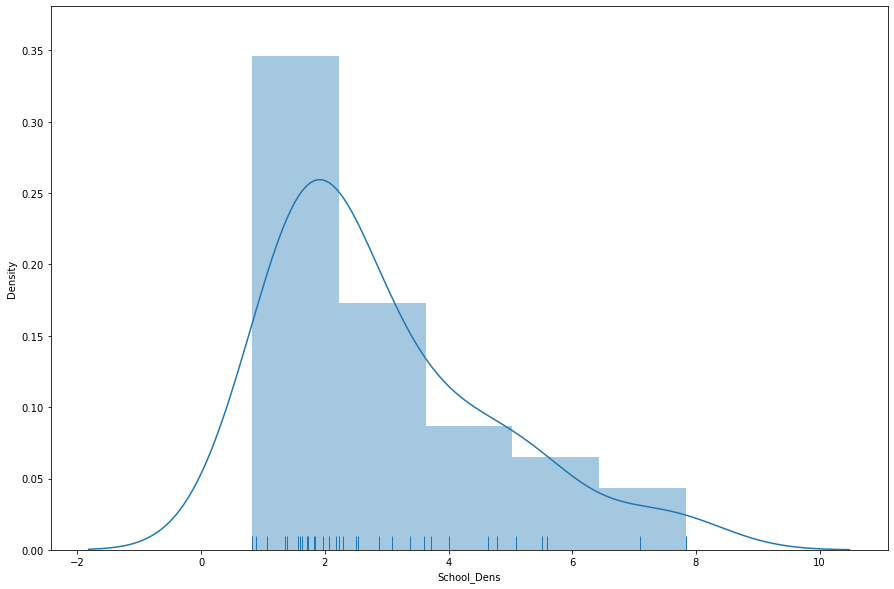

In [14]:
# Getting back the boroughs information
# TODO merge failure

school_boroughs_agg=lb_map.merge(school_boroughs_agg1,how='left',right_on=school_boroughs_agg1['NewCode'],left_on=lb_map['GSS_CODE'])
# Calculating school density
school_boroughs_agg['School_Dens'] = school_boroughs_agg['School_Count']/(school_boroughs_agg['AreaDens']*.01) #We multiply the value of hectares by .01 to obtain a final measure in terms of units per Sq.Km
h = seaborn.distplot(school_boroughs_agg['School_Dens'], bins=5, rug=True)
school_boroughs_agg.drop(['key_0','NewCode_x'],axis=1)
school_boroughs_agg.to_csv("junk1.csv",index=False)

We notice a heavily right skewed distribution which means that mean is bigger than median as there are quite a few boroughs
with higher school density. 

Let's look at 3 common classification schemes to understand more about the distribution of the data and to choose the best one
1) Equal Interval <br>
2) Mean-Standard deviation <br>
3) Fisher-Jenks <br>

# Equal Interval
The basic concept of the equal interval scheme is that each bin contains an equal width ($w$) of the attribute value for a specified number of bins ($k$). In ```mapclassify``` we can specify our preferred $k$ value, and the ```EqualInterval``` function automatically divides the variable of interest (in this case, 'House_Dens') into $k$ bins.

In [15]:
#Equal interval classification
ei = mapclassify.EqualInterval(school_boroughs_agg.School_Dens, k=5)
ei

EqualInterval       

  Interval     Count
--------------------
[0.83, 2.23] |    16
(2.23, 3.63] |     8
(3.63, 5.03] |     4
(5.03, 6.43] |     3
(6.43, 7.83] |     2

As you can see, each of the bins has the same width of $w$ = 1.4. This value of $k$ = 5 also corresponds directly to the default histogram displayed above. Let's take a look at what this looks like mapped using a simple single-hue 'Blues' color palette (we'll discuss color palettes in more detail below).

In [16]:
school_boroughs_agg.head()

,key_0,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Code,...,NewCode_y,AreaDens,PopDens_y,Avg_Age,Unemp_rate,Median_Income,Avg_CrimeRate,Avg_house_price,School_Count,School_Dens
0,E09000021,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"MULTIPOLYGON (((516400.440 160208.103, 516406....",E09000021,...,E09000021,3726.117,47.1,37.1,4.5,43940.0,58.5,410000.0,64,1.717606
1,E09000008,Croydon,E09000008,8649.441,0.000,F,None,None,"MULTIPOLYGON (((535007.659 159511.086, 535003....",E09000008,...,E09000008,8649.441,44.7,37.0,4.1,37000.0,77.0,300000.0,159,1.838269
2,E09000006,Bromley,E09000006,15013.487,0.000,F,None,None,"MULTIPOLYGON (((540371.955 157536.846, 540359....",E09000006,...,E09000006,15013.487,21.8,40.2,5.3,43060.0,64.1,374975.0,133,0.885870
3,E09000018,Hounslow,E09000018,5658.541,60.755,F,None,None,"MULTIPOLYGON (((521974.460 178105.954, 521966....",E09000018,...,E09000018,5658.541,49.0,35.8,4.3,35330.0,79.2,355000.0,97,1.714223
4,E09000009,Ealing,E09000009,5554.428,0.000,F,None,None,"MULTIPOLYGON (((510252.384 182887.413, 510248....",E09000009,...,E09000009,5554.428,63.3,36.2,5.8,36070.0,75.5,430000.0,124,2.232453


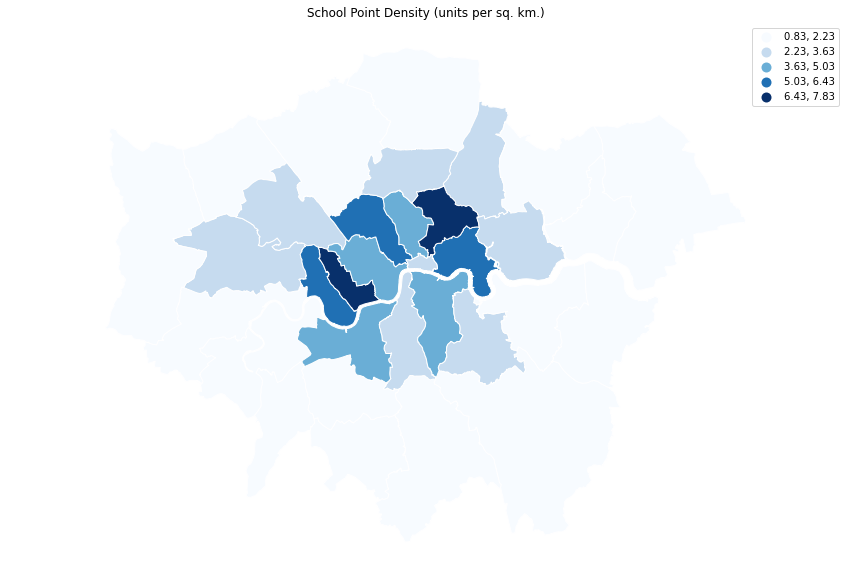

In [17]:
f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
school_boroughs_agg.plot(ax=ax, column='School_Dens', legend=True, cmap='Blues', scheme='EqualInterval', k=5, edgecolor='white')
ax.set_axis_off() #Remove axes from plot 
ax.set_title('School Point Density (units per sq. km.)') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

# Mean-Standard Deviation
Often in spatial analysis, however, we are interested in better understanding the location and context of *outliers*, which can be done using the mean-standard deviation classifier. This scheme defines class boundaries as some distance from the attribute mean in terms of multiples of the standard deviation of the attribute. For the default $k$ = 5, the common definition is to set the upper and lower bins as two standard deviations above and below the mean (respectively), while the fourth and second bins are set to within one standard deviation of the attribute, and the middle bin straddles the attribute mean. Any values larger or smaller than two standard deviations from the mean are placed into the upper and lower bins (respectively).

In [18]:
msd = mapclassify.StdMean(school_boroughs_agg.School_Dens)
msd

StdMean               

   Interval      Count
----------------------
( -inf, -0.64] |     0
(-0.64,  1.14] |     3
( 1.14,  4.69] |    24
( 4.69,  6.47] |     4
( 6.47,  7.83] |     2

However, mean-standard deviation approach would be useful if we had a normal distribution, but in this case is it right skewed, however, we can still check for possible outliers

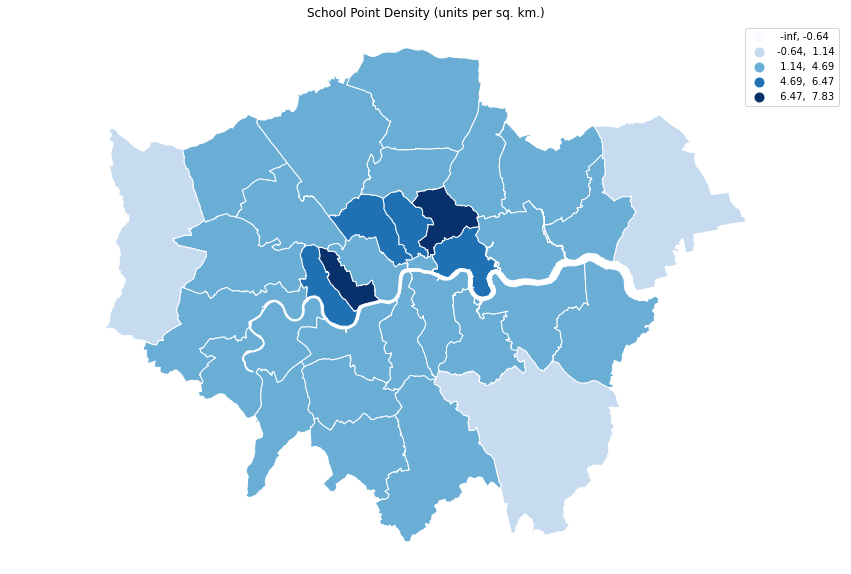

In [19]:
f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
school_boroughs_agg.plot(ax=ax, column='School_Dens', legend=True, cmap='Blues', scheme='StdMean', k=5, edgecolor='white')
ax.set_axis_off() #Remove axes from plot 
ax.set_title('School Point Density (units per sq. km.)') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

Given the spatial position of these boroughs, we notice that the 2 outlier school point density is across the centre which is unexpected. We will have to look at the the points of the schools on the map to verify the same.

# Fisher-Jenks
The final classification scheme we'll look at is Fisher-Jenks, which is representative of a number of similar schemes that use a heuristic approach to optimize the breaks between bins by attempting to minimize the sum of absolute deviations around class means (ADCM), i.e., to increase within-group similarity as much as possible.
> The approach begins with a prespecified number of classes and an arbitrary initial set of class breaks - for example using quintiles. The algorithm attempts to improve the objective function by considering the movement of observations between adjacent classes. For example, the largest value in the lowest quintile would be considered for movement into the second quintile, while the lowest value in the second quintile would be considered for a possible move into the first quintile. The candidate move resulting in the largest reduction in the objective function would be made, and the process continues until no other improving moves are possible.

Fisher-Jenks uses a dynamic programming approach that is guaranteed to produce an optimal classification for a prespecified number of classes ($k$) and is generally a good middle-ground approach (as it is data-driven) when you don't have any prior assumptions or inclinations about the pattern of attribute values in the dataset.

In [20]:
np.random.seed(12345) #Setting the seed ensures that any replications of the random class generation process will produce the same results.
fj5 = mapclassify.FisherJenks(school_boroughs_agg.School_Dens, k=5)
fj5

FisherJenks         

  Interval     Count
--------------------
[0.83, 1.84] |    13
(1.84, 2.88] |     8
(2.88, 4.01] |     5
(4.01, 5.60] |     5
(5.60, 7.83] |     2

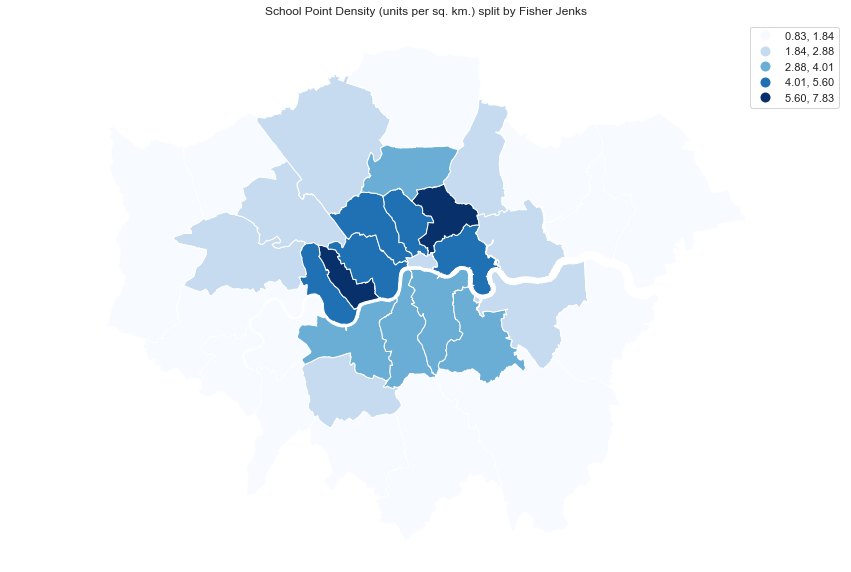

In [133]:
f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
school_boroughs_agg.plot(ax=ax, column='School_Dens', legend=True, cmap='Blues', scheme='FisherJenks', k=5, edgecolor='white')
ax.set_axis_off() #Remove axes from plot 
ax.set_title('School Point Density (units per sq. km.) split by Fisher Jenks') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

### NOTE
This would mean that if there are same number of schools, then naturally outskirts of london has larger areas and hence lesser density. We would also have to look at population density before concluding

### Comparing Classification Schemes
We can explicitly compare the performance of different classification schemes in terms of ADCM for a specified value of $k$ (in this case, 5).

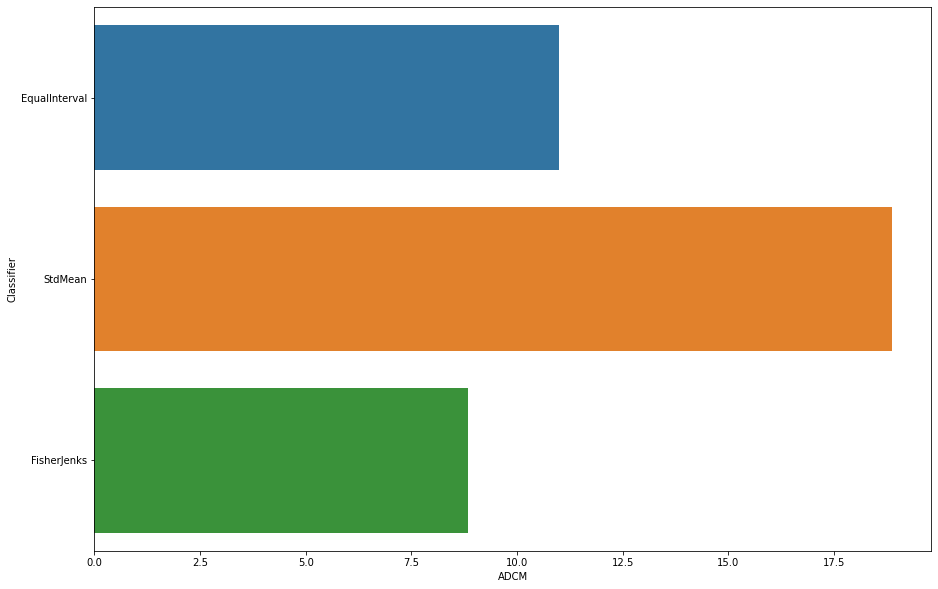

In [22]:
class5 = ei, msd, fj5
fits = np.array([ c.adcm for c in class5])
data = pd.DataFrame(fits)
data['classifier'] = [c.name for c in class5]
data.columns = ['ADCM', 'Classifier']
ax = seaborn.barplot(y='Classifier', x='ADCM', data=data) #Creates bar graph

We notice that FisherJenks has an optimum way of classifying boruoughs based on density, however, mean-standard deviation method shows evident outlier boroughs in the centre of London

Now that we have considered FisherJenks split for classification, let us look at the counts data, areadensity and population density to understand the schools data distribution better

### House-count distribution across boroughs

TODO: Something wrong with Lewinsham borough in the map below

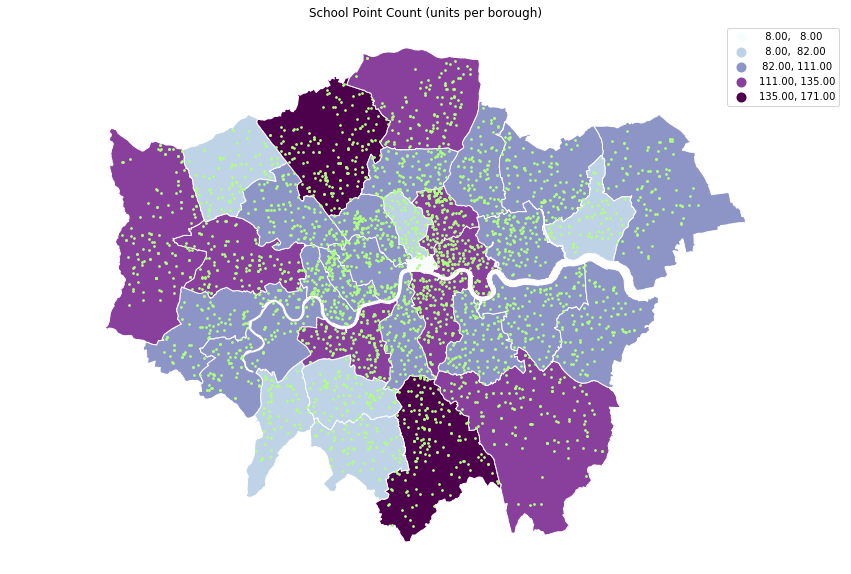

In [23]:
f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
school_boroughs_agg.plot(ax=ax, column='School_Count', legend=True, cmap='BuPu', scheme='FisherJenks', k=5, edgecolor='white')
school_boroughs.plot(ax=ax, color='#AFFF7F', markersize=3)
ax.set_axis_off() #Remove axes from plot 
ax.set_title('School Point Count (units per borough)') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()
school_boroughs.to_csv("junk1.csv")

If we instead map house point density - controlling for the underlying size of each borough - we get a much more accurate picture of the underlying concentration of house points in the region.

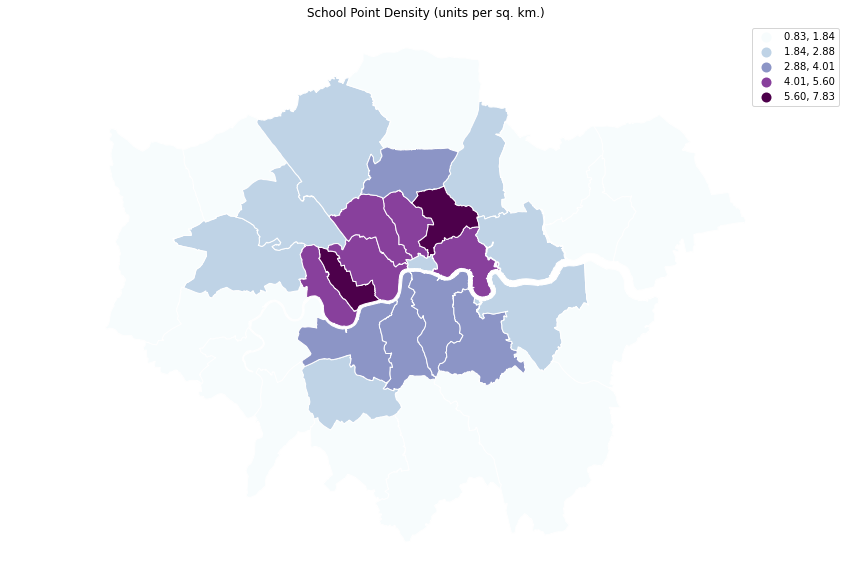

In [24]:
f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
school_boroughs_agg.plot(ax=ax, column='School_Dens', legend=True, cmap='BuPu', scheme='FisherJenks', k=5, edgecolor='white')
ax.set_axis_off() #Remove axes from plot 
ax.set_title('School Point Density (units per sq. km.)') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

Once we add the area into the equation, we notice that the schools are the least in the sub-urban outskirts area, which makes sense logically too

In [25]:
school_boroughs["long"]= school_boroughs.geometry.apply(lambda p: p.x)
school_boroughs["lat"]= school_boroughs.geometry.apply(lambda p: p.y)

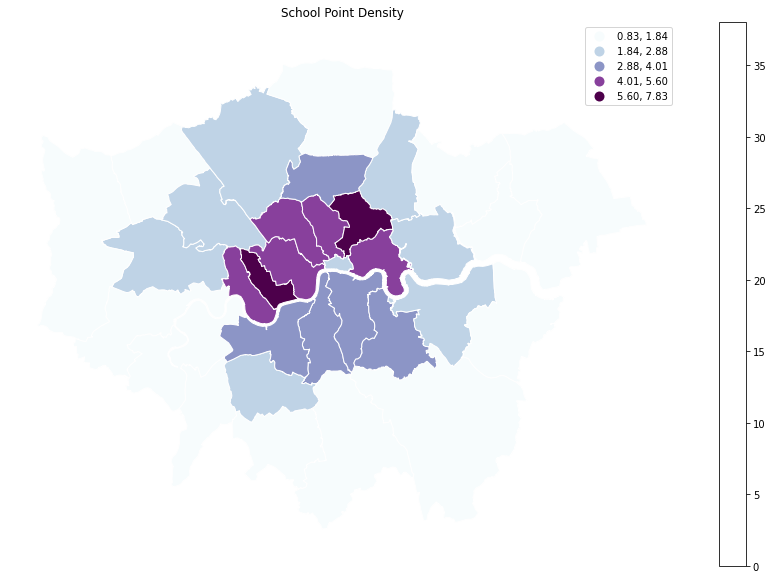

In [26]:
f, ax = plt.subplots(1, figsize=(15, 10)) # Setup figure and axis
school_boroughs_agg.plot(ax=ax, column='School_Dens', legend=True, cmap='BuPu', scheme='FisherJenks', k=5, edgecolor='white')
hb = ax.hexbin(school_boroughs.long, school_boroughs.lat, gridsize=30, alpha=0., cmap='BuPu') # Add hexagon layer that displays count of points in each polygon
ax.set_axis_off() #Remove axes from plot 
ax.set_title('School Point Density') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.colorbar(hb) # Add a colorbar (optional)
plt.show()

If we overlay that grid on the densities by borough, you start to see some really interesting patterns that are mismatched between scales - notice large concentrations in single hexagons in several outlying boroughs in the north, sounth, and east (despite low overall densities in those boroughs). This overlay also helps to illustrate the issues described by the __Modifiable Areal Unit Problem__ (MAUP) - the same underlying data (points), when aggregated according to a different zonal scheme (hexagons) demonstrates a very different spatial pattern - the concentrations no longer appear to be primarily in the south-central boroughs, but rather in specific hexagons somewhat evenly distributed across the entire urban area.  

Which zonal scheme provides a more "accurate" picture of the process? That depends on the characteristics of the process itself (e.g., are houses sold based on characteristics of a small hexagonal radius, or the larger neighborhood? what is the scale of urban interaction?), complimentary data, and subjective interpretations. Generally smaller spatial units provide for a more fine-grained understanding of locational characteristics, but some urban economic processes inherently play out at larger scales (economic markets and commuting, for example, are generally characteristics of large urban regions). The important point is, even if you do not have access to the individual data units, make sure you understand *how* spatial concentration might be influencing the aggregate patterns being mapped.

In [30]:
nearest_schls_hp=pd.read_csv("nearest_school.csv")

In [31]:
#def nearest_school(building_df, school_df):
    #return school_df.distance(building_df).min()
#hp['nearest_school_distance'] = hp.geometry.apply(nearest_school, args=(schools,))

In [32]:
nearest_schls_hp=gpd.read_file('hpscdis.geojson')

In [33]:
nearest_schls_hp.columns.to_list()

['id',
 'ID',
 'categorytype',
 'dateoftransfer',
 'dointr',
 'doterm',
 'duration',
 'nearest_school_distance',
 'numberrooms',
 'oldnew',
 'pcd',
 'pcd2',
 'postcode',
 'price',
 'priceper',
 'propertytype',
 'recordstatus',
 'tfarea',
 'year',
 'geometry']

In [34]:
nearest_schls_hp.crs = lb_map.crs
lb_hp_ns = gpd.sjoin(nearest_schls_hp,lb_map)
lb_hp_ns.describe()

,ID,dointr,doterm,nearest_school_distance,numberrooms,price,priceper,tfarea,year,index_right,...,Unemp,Disabled,Degrees,MedInc,CrimeRate,HousePrice,GreenSpace,CarsHH,NonEng,br_ID
count,641139.000000,641139.000000,284.000000,641139.000000,641139.000000,6.411390e+05,641139.000000,641139.000000,641139.000000,641139.000000,...,640067.000000,640067.000000,640067.000000,641139.000000,640067.000000,6.411390e+05,641139.000000,641139.000000,640067.000000,641139.000000
mean,320581.962258,198301.430092,201604.299296,310.414049,4.137404,5.238969e+05,5769.060206,88.467390,2014.657421,14.222799,...,6.030468,15.861487,49.824921,39234.280413,81.325178,4.395256e+05,34.084901,0.866874,44.532366,15.222799
std,185090.681415,718.475014,149.624448,174.930210,1.710563,6.004449e+05,3218.872384,46.366296,2.405846,8.848733,...,1.732947,2.275300,10.957238,5794.885608,29.012318,1.736626e+05,12.382235,0.277428,9.843340,8.848733
min,1.000000,198001.000000,200810.000000,0.654711,1.000000,1.000000e+04,256.529851,10.000000,2011.000000,0.000000,...,3.800000,10.800000,26.000000,28780.000000,50.400000,2.435000e+05,4.800000,0.400000,25.200000,1.000000
25%,160292.500000,198001.000000,201611.000000,183.572768,3.000000,2.700000e+05,3753.133298,60.000000,2013.000000,6.000000,...,4.600000,14.600000,42.600000,35420.000000,62.900000,3.400000e+05,24.800000,0.600000,38.900000,7.000000
50%,320577.000000,198001.000000,201611.000000,281.124660,4.000000,3.850000e+05,5000.000000,78.570000,2014.000000,14.000000,...,5.700000,15.900000,47.900000,37040.000000,76.600000,3.961500e+05,33.600000,0.900000,43.600000,15.000000
75%,480861.500000,198001.000000,201611.000000,405.203253,5.000000,5.750000e+05,6843.748523,103.000000,2017.000000,21.000000,...,7.600000,17.500000,58.000000,43060.000000,90.800000,4.750000e+05,40.600000,1.100000,51.100000,22.000000
max,641189.000000,202004.000000,201912.000000,2621.869020,20.000000,3.772000e+07,50000.000000,959.740000,2019.000000,32.000000,...,11.000000,21.300000,69.500000,63620.000000,212.400000,1.200000e+06,59.300000,1.200000,66.500000,33.000000


In [35]:
lb_hp_ns.columns.to_list()

['id',
 'ID',
 'categorytype',
 'dateoftransfer',
 'dointr',
 'doterm',
 'duration',
 'nearest_school_distance',
 'numberrooms',
 'oldnew',
 'pcd',
 'pcd2',
 'postcode',
 'price',
 'priceper',
 'propertytype',
 'recordstatus',
 'tfarea',
 'year',
 'geometry',
 'index_right',
 'NAME',
 'GSS_CODE',
 'HECTARES',
 'NONLD_AREA',
 'ONS_INNER',
 'SUB_2009',
 'SUB_2006',
 'Code',
 'NewCode',
 'PopDens',
 'AveAge',
 'BornAbroad',
 'Unemp',
 'Disabled',
 'Degrees',
 'MedInc',
 'CrimeRate',
 'HousePrice',
 'GreenSpace',
 'CarsHH',
 'NonEng',
 'br_ID']

In [36]:
lb_hp_ns_boroughs_agg1 = lb_hp_ns.groupby(['NewCode','NAME']).agg({'priceper':'median','HECTARES':'mean','PopDens':'mean','AveAge':'mean','Unemp':'mean','MedInc':'mean','CrimeRate':'mean','HousePrice':'mean','ID':'count','nearest_school_distance':['mean','median']})
lb_hp_ns_boroughs_agg1.columns = ['Median_priceper','AreaDens','PopDens','Avg_Age','Unemp_rate','Median_Income','Avg_CrimeRate','Avg_house_price','house_Count','avg_sch_dist','median_sch_dist']

In [37]:
lb_hp_ns_boroughs_agg1.reset_index(inplace=True)
lb_hp_ns_boroughs_agg1

,NewCode,NAME,Median_priceper,AreaDens,PopDens,Avg_Age,Unemp_rate,Median_Income,Avg_CrimeRate,Avg_house_price,house_Count,avg_sch_dist,median_sch_dist
0,E09000001,City of London,10522.076726,314.942,30.3,43.2,NaN,63620.0,NaN,799999.0,1072,260.924051,208.015933
1,E09000002,Barking and Dagenham,3267.477204,3779.934,57.9,32.9,11.0,29420.0,83.4,243500.0,13063,322.713346,308.099490
2,E09000003,Barnet,5259.914450,8674.837,44.9,37.3,8.5,40530.0,62.7,445000.0,27366,324.288741,303.390465
3,E09000004,Bexley,3562.500000,6428.649,40.3,39.0,7.6,36990.0,51.8,275000.0,24197,369.575277,341.130037
4,E09000005,Brent,5217.391304,4323.270,76.8,35.6,7.5,32140.0,78.8,407250.0,12134,287.633255,267.644542
5,E09000006,Bromley,4277.699860,15013.487,21.8,40.2,5.3,43060.0,64.1,374975.0,37951,421.061946,384.739470
6,E09000007,Camden,9345.794393,2178.932,111.3,36.4,4.0,43750.0,123.5,700000.0,13779,227.549154,207.960824
7,E09000008,Croydon,3910.946255,8649.441,44.7,37.0,4.1,37000.0,77.0,300000.0,20900,346.352998,318.663966
8,E09000009,Ealing,5428.571429,5554.428,63.3,36.2,5.8,36070.0,75.5,430000.0,21285,343.274569,320.733718
9,E09000010,Enfield,4244.751138,8220.025,41.2,36.3,3.8,33110.0,69.4,320000.0,22816,371.353736,333.354322


In [38]:
lb_hp_ns[['NAME','price','HousePrice','nearest_school_distance']].head(10)
lb_hp_ns.columns.tolist()

['id',
 'ID',
 'categorytype',
 'dateoftransfer',
 'dointr',
 'doterm',
 'duration',
 'nearest_school_distance',
 'numberrooms',
 'oldnew',
 'pcd',
 'pcd2',
 'postcode',
 'price',
 'priceper',
 'propertytype',
 'recordstatus',
 'tfarea',
 'year',
 'geometry',
 'index_right',
 'NAME',
 'GSS_CODE',
 'HECTARES',
 'NONLD_AREA',
 'ONS_INNER',
 'SUB_2009',
 'SUB_2006',
 'Code',
 'NewCode',
 'PopDens',
 'AveAge',
 'BornAbroad',
 'Unemp',
 'Disabled',
 'Degrees',
 'MedInc',
 'CrimeRate',
 'HousePrice',
 'GreenSpace',
 'CarsHH',
 'NonEng',
 'br_ID']

## Exploratory Data Analysis (EDA)

While we have explored other EDA techniques in previous practicals (e.g., histograms, boxplots, etc.), it is useful to briefly examine a couple of very useful plots from ```seaborn```.  

The violin plot is a useful a combination of the box plot and histogram/probability density graph - it displays both the inter-quartile range, median, and high/low outliers like a box plot along its central axis: the thick black line ends at either end  of the "box" in the traditional box plot, while the thin black line extends to the ends of the "whiskers"; the full extension of the violin body encompasses all of the data (i.e., outliers). At the same time, the body of the violin displays the probability density of the data, so you can quickly get a sense for the skew, range, and modality of a variable. In this case, we can clearly see that the distribution of median housing prices per square meter is right-skewed, with a large number of positive outliers. At the same time, the distribution is somewhat bi-modal, with a relatively large number of "0" values as well. 

This is useful information, but from this aspatial plot alone, it is hard what exactly to make of it all. In essence, our ESDA techniques will attempt to explicitly understand 'where' these high and low outliers are located and what relationship they have to surrounding values in order to better contextualize the underlying process generating this pattern.

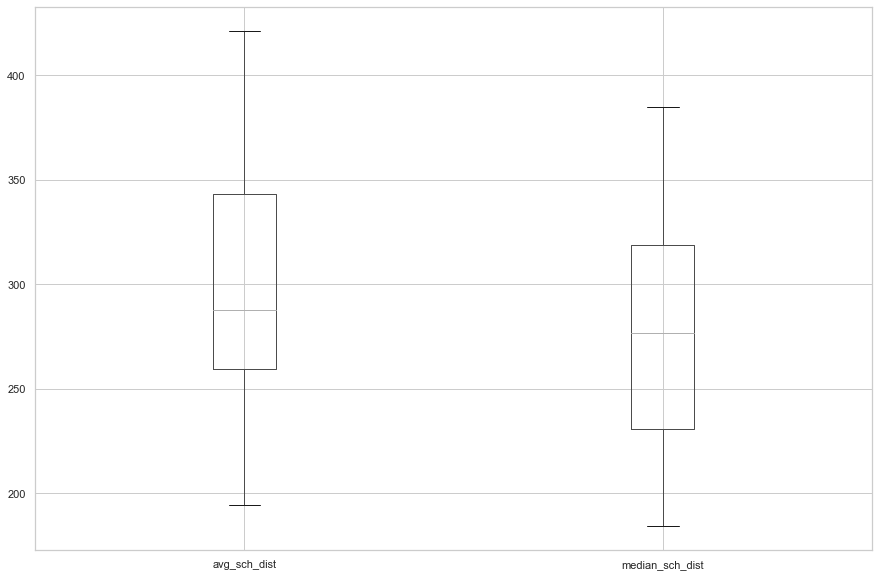

In [39]:
seaborn.set_theme(style="whitegrid")
bxplot=lb_hp_ns_boroughs_agg1.boxplot(column=['avg_sch_dist','median_sch_dist'])

As you see that there is an increase in the range for mean, we will be considering the median.

<AxesSubplot:xlabel='median_sch_dist', ylabel='Avg_house_price'>

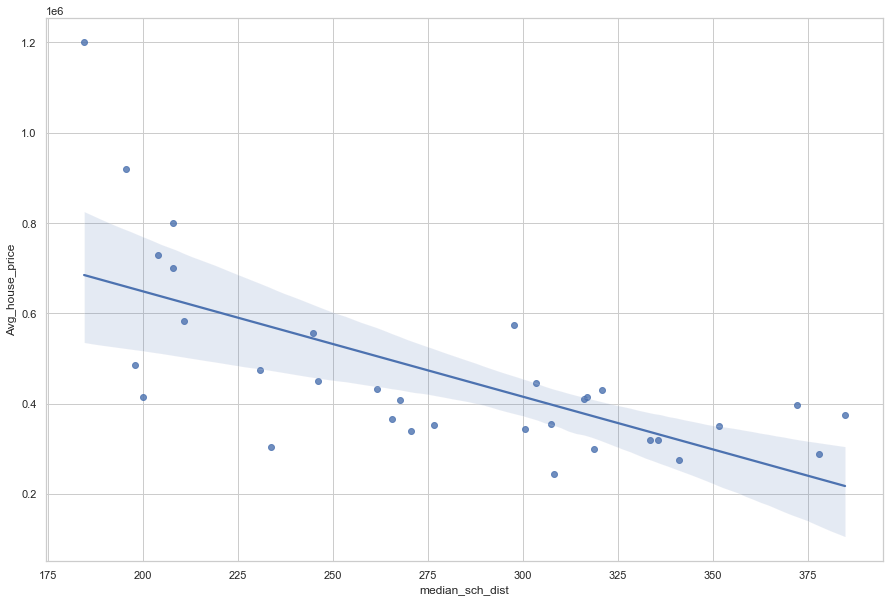

In [40]:
# Check the non-spatial relationship between the schools median nearest distance in boroughs vs avg_house_price
seaborn.regplot(data=lb_hp_ns_boroughs_agg1, x="median_sch_dist", y="Avg_house_price")

From the graph above, it is evident that there is a inversely proportional relationship between median school distance to house w.r.t average housr price. Hence, we can consider a normal distribution assumption, and as from the reference papers. we see that other variables are already following a normal distribution relationship. Hence we can move forward with OLS modeling. 

# EDA on Response variable

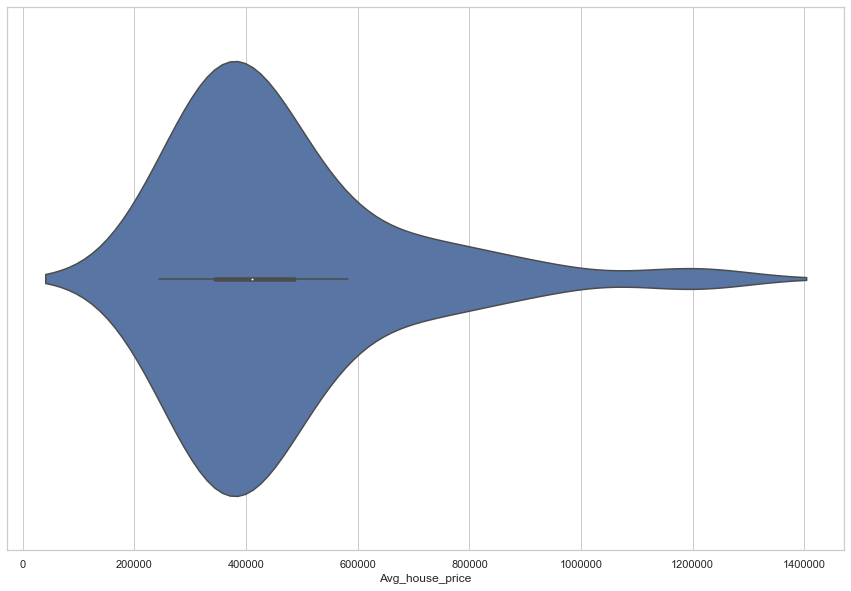

In [41]:
#Violin plot of average house price
seaborn.set_theme(style="whitegrid")
bx = seaborn.violinplot(x=lb_hp_ns_boroughs_agg1["Avg_house_price"])
plt.ticklabel_format(style='plain', axis='x')

## Global Spatial Autocorrelation 

In [42]:
lb_hp_ns11 = lb_hp_ns[(lb_hp_ns["year"]==2011)]
lb_hp_ns11_allcols = lb_hp_ns11
lb_hp_ns11.head()

,id,ID,categorytype,dateoftransfer,dointr,doterm,duration,nearest_school_distance,numberrooms,oldnew,...,Unemp,Disabled,Degrees,MedInc,CrimeRate,HousePrice,GreenSpace,CarsHH,NonEng,br_ID
2,2,3,A,2011-12-22,201107.0,NaN,F,940.684187,9.0,Y,...,4.1,17.5,40.6,37000,77.0,300000,37.1,1.0,36.7,2
129603,129603,129604,A,2011-08-24,198001.0,NaN,F,292.384279,4.0,N,...,4.1,17.5,40.6,37000,77.0,300000,37.1,1.0,36.7,2
129604,129604,129605,A,2011-08-25,199007.0,NaN,F,223.726974,5.0,N,...,4.1,17.5,40.6,37000,77.0,300000,37.1,1.0,36.7,2
129620,129620,129621,A,2011-07-04,199007.0,NaN,F,277.453776,6.0,N,...,4.1,17.5,40.6,37000,77.0,300000,37.1,1.0,36.7,2
129628,129628,129629,A,2011-03-04,199208.0,NaN,F,179.677731,4.0,N,...,4.1,17.5,40.6,37000,77.0,300000,37.1,1.0,36.7,2


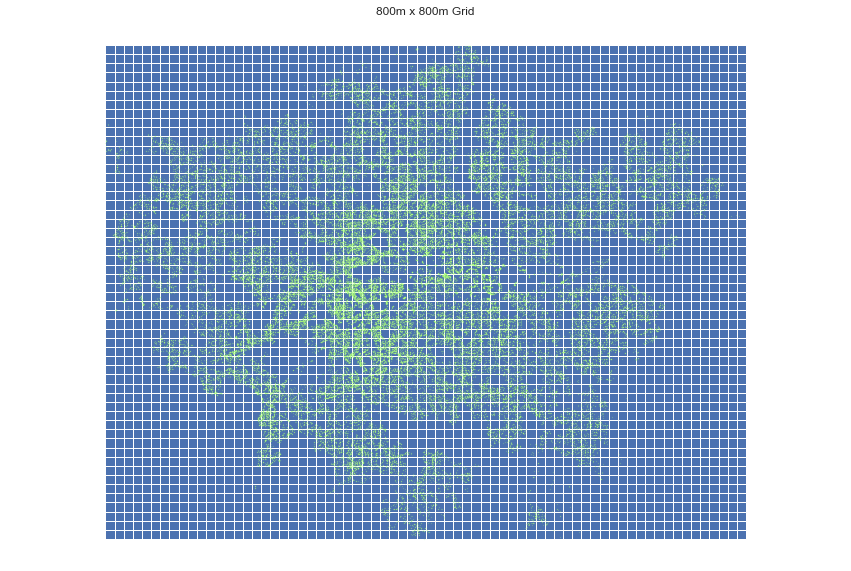

In [43]:
# Get data ready for global spatial correlation
xmin,ymin,xmax,ymax =  lb_hp_ns11.total_bounds
length = 800
wide = 800

cols = list(np.arange(xmin, xmax + wide, wide))
rows = list(np.arange(ymin, ymax + length, length))

polygons = []
for x in cols[:-1]:
    for y in rows[:-1]:
        polygons.append(Polygon([(x,y), (x+wide, y), (x+wide, y+length), (x, y+length)]))

grid = gpd.GeoDataFrame({'geometry':polygons})



f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
grid.plot(ax=ax, legend=False, edgecolor='white')
lb_hp_ns11.plot(ax=ax, color='#AFFF7F', markersize=.05, alpha=.5)
ax.set_axis_off() #Remove axes from plot 
ax.set_title('800m x 800m Grid') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

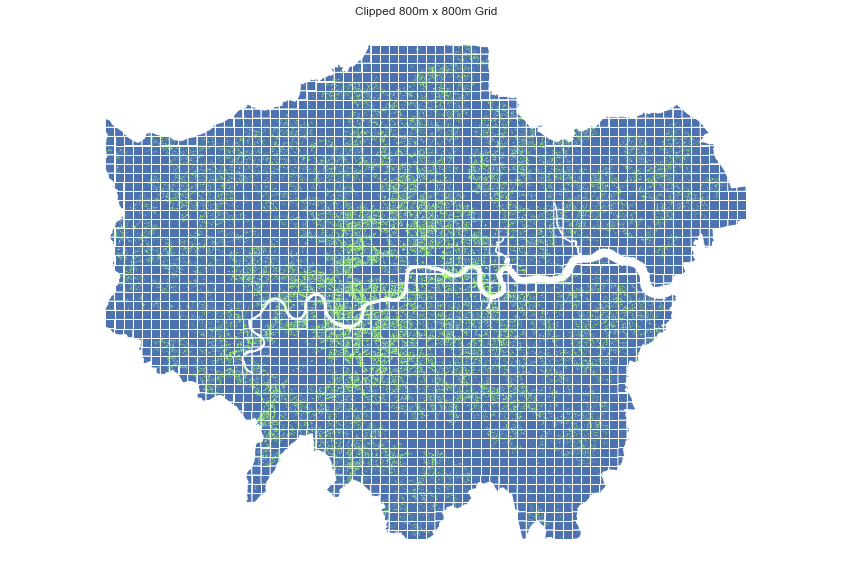

In [44]:
# Clipping the grip to only london
grid_clip = gpd.clip(grid, lb) #Clip the grid to the extent of the London boroughs GeoJSON

f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
grid_clip.plot(ax=ax, legend=False, edgecolor='white')
lb_hp_ns11.plot(ax=ax, color='#AFFF7F', markersize=.05, alpha=.5)
ax.set_axis_off() #Remove axes from plot 
ax.set_title('Clipped 800m x 800m Grid') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

Now we create an index for grid cells ('ID2') (since they have no pre-existing naming or ID convention), spatially-join the housing points to grid cells, and aggregate by taking the mean housing price area by grid cell ('Mean_grid_average_hp') and count of housing points per grid cell ('House_Count_grid'):

In [45]:
grid_clip.head()

,geometry
1620,"POLYGON ((528905.000 157644.000, 528905.000 15..."
1674,"POLYGON ((528905.000 157644.000, 529705.000 15..."
1675,"POLYGON ((528905.000 158444.000, 529705.000 15..."
1621,"POLYGON ((528905.000 158444.000, 528905.000 15..."
1676,"POLYGON ((528905.000 159244.000, 529705.000 15..."


In [46]:
lb_hp_ns11
lb_hp_ns11=lb_hp_ns11[['price','year','ID','tfarea','numberrooms','geometry']]

In [47]:
grid_clip['ID2'] = grid_clip.index+1
hp2 = gpd.sjoin(lb_hp_ns11,grid_clip)
hp3 = hp2.groupby('ID2').agg({'price':'median','ID':'count'})
hp3.columns = ['Mean_grid_average_hp','House_Count_grid']
hp3 = hp3.reset_index()

We merge the aggregated values back to the clipped grid cells on an 'outer' basis (because we want to retain grid cells that do not contain any housing points) and fill those grid cells with missing values with a median housing price (and house count value) of 0:

In [48]:
grid_clip2 = grid_clip.merge(hp3, how='outer')
grid_clip2['Mean_grid_average_hp'] = grid_clip2['Mean_grid_average_hp'].fillna(0) #Fill median house price NAs w/0
grid_clip2['House_Count_grid'] = grid_clip2['House_Count_grid'].fillna(0) #Fill house count NAs w/0

One final adjustment before we can plot these grid cells in the proper geographic context - we need to give them a coordinate reference system (CRS) so that we can recognize their true location on planet Earth (rather than blank visual plot space in Python). Since the grid was originally drawn from housing points that were in a CRS, namely the European Petroleum Survey Group (EPSG) 27700 'British National Grid -- UK Ordnance Survey', we can assign that CRS to the grid and then re-project it to EPSG 4326 'World Geodetic System 1984', which is a global-scale CRS that is drawn in units of decimal degrees rather than meters:

In [49]:
grid_clip2 = grid_clip2.set_crs(epsg=27700)
grid_clip2.to_crs(epsg=4326)

,geometry,ID2,Mean_grid_average_hp,House_Count_grid
0,"POLYGON ((-0.15221 51.30333, -0.15229 51.30133...",1621,0.0,0.0
1,"POLYGON ((-0.15221 51.30333, -0.14074 51.30315...",1675,460000.0,1.0
2,"POLYGON ((-0.15192 51.31052, -0.14045 51.31034...",1676,413000.0,11.0
3,"POLYGON ((-0.15192 51.31052, -0.15221 51.30333...",1622,950000.0,1.0
4,"POLYGON ((-0.15163 51.31771, -0.14016 51.31753...",1677,331750.0,4.0
...,...,...,...,...
2626,"POLYGON ((0.21927 51.62782, 0.21892 51.62064, ...",3341,0.0,0.0
2627,"POLYGON ((0.23082 51.62761, 0.21927 51.62782, ...",3396,0.0,0.0
2628,"POLYGON ((0.21927 51.62782, 0.21451 51.62791, ...",3342,0.0,0.0
2629,"POLYGON ((0.13809 51.62214, 0.13213 51.62224, ...",2963,0.0,0.0


This is necessary because the basemap generator ```contextily``` requires spatial data files to be drawn in WGS/Psuedo-Meractor (EPSG 3857) in order to recognize them.Contextilyis a very powerful tool that draws basemaps directly into the plot window (feel free to explore the documentation to find a variety of options for different basemaps). With our projections squared, we can now plot a choropleth of the clipped grid cells in terms of the median sales price per square meter by grid cell for 2011 with a map of London underneath for context:

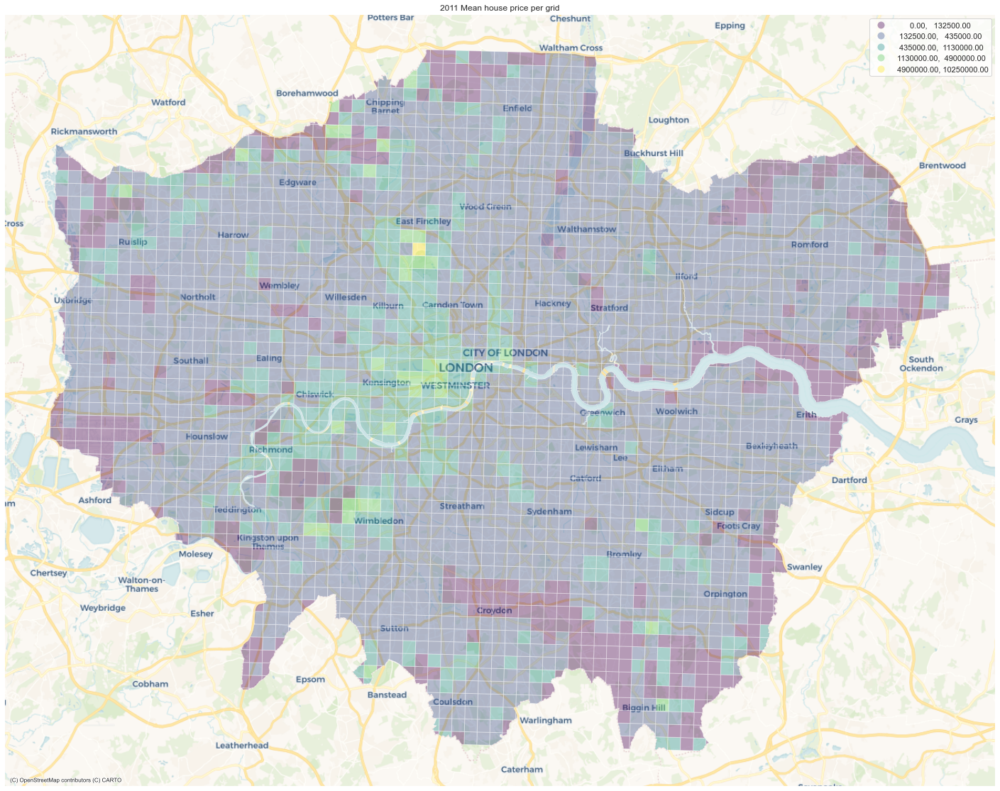

In [50]:
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
grid_clip2.to_crs('EPSG:3857').plot(ax=ax, column='Mean_grid_average_hp', cmap='viridis', legend=True, scheme='FisherJenks', k=5, edgecolor='white', alpha=.38)
ax.set_axis_off() #Remove axes from plot 
ax.set_title('2011 Mean house price per grid') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

### Global spatial autocorrelation

In [51]:
# Generate W from the GeoDataFrame
w = weights.Queen.from_dataframe(grid_clip2)
# Row-standardization
w.transform = 'R'

### Spatial Lag
The spatial lag operator is the most direct application of the spatial weights matrix and is used to find one half of the attribute + spatial similarity puzzle: the values of $X$ in the neighbors of each unit $i$ (the other half of the puzzle, as we will see, is *how similar each unit's values are to the values of their neighbors*). This is calculated by directly multiplying $W$ by the matrix of $X$ values; with a row-standardized matrix, the result is the average value of $X$ in $i$'s neighbors. "Conceptually, the spatial lag captures the behaviour of a variable in the immediate surroundings of each location; in that respect, it is akin to a local smoother of a variable". Calculation of the spatial lag is performed in one line in ```PySAL```:

In [52]:
grid_clip2['Mean_grid_average_hp'] = weights.spatial_lag.lag_spatial(w, grid_clip2['Mean_grid_average_hp'])

Now we plot the spatially-lagged value of median housing price per square meter next to the original value. As you can see, the spatially-lagged values are much smoother because they are averaging out the information from neighboring cells. This smoothed picture also gives us a somewhat easier-to-interpret pattern by more clearly delineating the cluster of high values in the center city (just a note: Kernel Density Estimation (KDE), a technique for analyzing point data, uses a similar principle to aggregate points to grid cells based on distance-weighted averages to displayed smoothed, easier-to-interpret patterns and probability densities; in this example, we have re-produced a somewhat naive version of KDE with our grid aggregation and spatial lag smoothing).

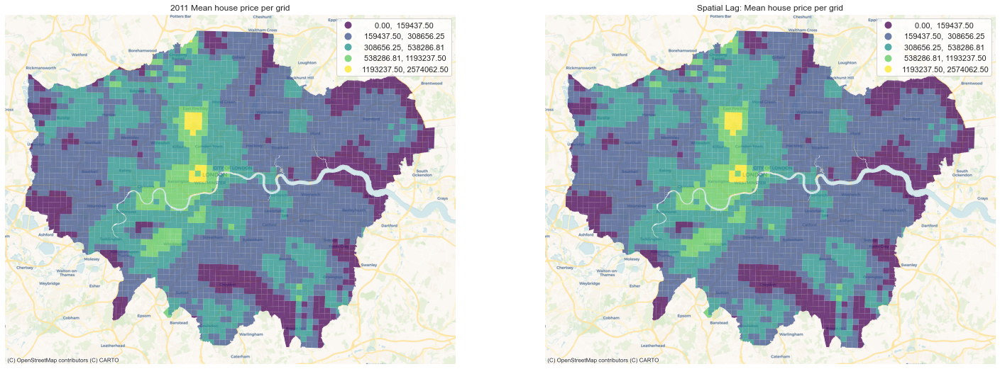

In [53]:
f, axs = plt.subplots(1, 2, figsize=(25, 20))
ax1, ax2 = axs

grid_clip2.to_crs('EPSG:3857').plot(column='Mean_grid_average_hp', cmap='viridis', scheme='FisherJenks',
        k=5, edgecolor='white', linewidth=0., alpha=0.75, legend=True, ax=ax1)
ax1.set_axis_off()
ax1.set_title("2011 Mean house price per grid")
cx.add_basemap(ax1, source=cx.providers.CartoDB.Voyager)

grid_clip2.to_crs('EPSG:3857').plot(column='Mean_grid_average_hp', cmap='viridis', scheme='FisherJenks',
        k=5, edgecolor='white', linewidth=0., alpha=0.75, legend=True, ax=ax2)
ax2.set_axis_off()
ax2.set_title("Spatial Lag: Mean house price per grid")
cx.add_basemap(ax2, source=cx.providers.CartoDB.Voyager)

### Join Count
The goal of a global spatial autocorrelation statistic, then, is to measure the extent to which $i$'s values of $X$ are correlated with the values of $X$ in $i$'s neighborhood (i.e., the spatial lag of $X$). The most basic version of assessing this correlation is the "join-count" statistic, which measures spatial association in terms of a binary variable. The traditional case is enumerated in terms of "black" and "white" cells (as on a chess board); in this case, we'll re-categorize our median price per square foot variable in terms of "high" values (i.e., "black") over £6,500 per square meter. You can see the split in the distribution of cells through another scatterplot:

<AxesSubplot:xlabel='High', ylabel='Mean_grid_average_hp'>

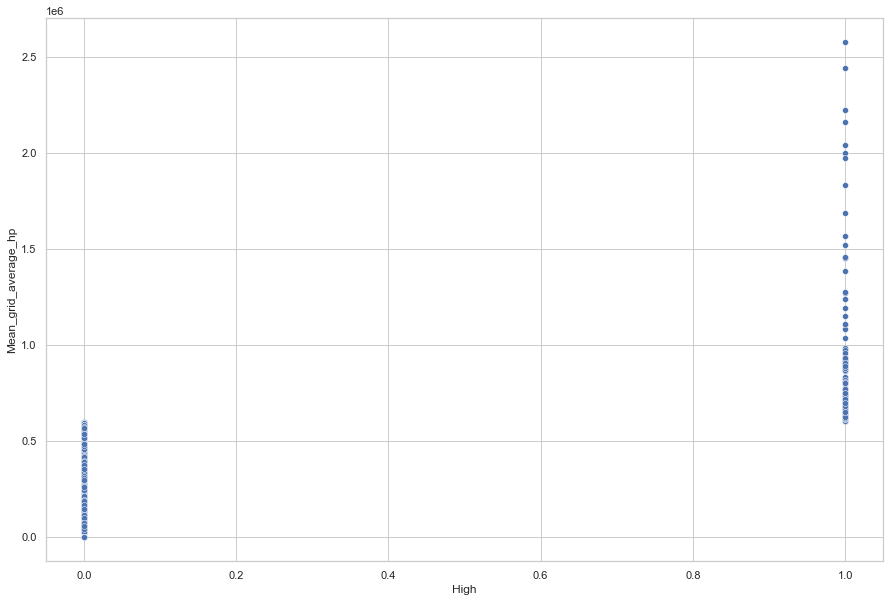

In [54]:
grid_clip2['High'] = (grid_clip2['Mean_grid_average_hp'] > 600000).astype(int)
seaborn.scatterplot(data=grid_clip2, x="High", y="Mean_grid_average_hp")

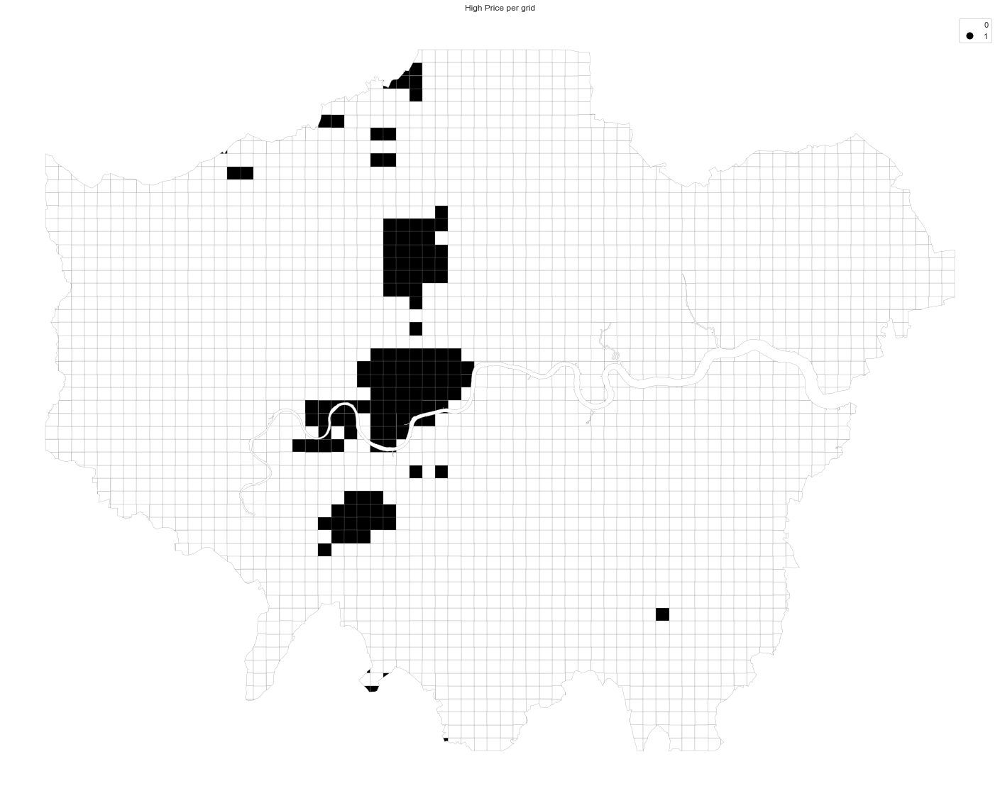

In [55]:
f, ax = plt.subplots(1, figsize=(25, 20))
grid_clip2.plot(ax=ax, column='High', categorical=True, legend=True, 
        edgecolor='0.5', linewidth=0.25, cmap='Greys');
ax.set_axis_off()
ax.set_title('High Price per grid')
plt.axis('equal')
plt.show()

### Hypothesis testing for spatial autocorrelation

From the map there seems to be a clear pattern of spatial autocorrelation: black cells tend to be located near other black cells, and white cells near one another (i.e., there is a stark cluster of cells with high values of mean price of houses near the London city center). The join count statistic tests this in a very straightforward way: by counting up the number of various types of joins (i.e., black-black, black-white, and white-white) observed and comparing those counts to the null hypothesis "expected" number of counts based on the assumption that black and white cells are randomly distributed across the region (this assumption is called *complete spatial randomness* or CSR). Possible joins are evaluated based on the given spatial weights matrix.

In [56]:
w.transform = 'O' #Transform weights matrix back to non-standardized state in order to sum total counts
jc = esda.join_counts.Join_Counts(grid_clip2['High'], w)

The 'jc' object contains the counts of observed black-black occurances:

In [57]:
jc.bb

320.0

as well as white-white:

In [58]:
jc.ww

9242.0

and black-white:

In [59]:
jc.bw

370.0

In [60]:
grid_clip2.describe()

,ID2,Mean_grid_average_hp,House_Count_grid,High
count,2631.000000,2.631000e+03,2631.000000,2631.000000
mean,1836.636260,2.844152e+05,27.337514,0.050931
std,917.229243,2.017017e+05,28.838176,0.219899
min,23.000000,0.000000e+00,0.000000,0.000000
25%,1116.500000,1.857641e+05,3.000000,0.000000
50%,1850.000000,2.526844e+05,21.000000,0.000000
75%,2563.500000,3.420750e+05,39.000000,0.000000
max,3765.000000,2.574062e+06,212.000000,1.000000


These three values added together gives us the total number of joins in the dataset. Since there are 2631 total rows in the grid_clip2 dataset, this means that each observation has 3.77 neighbors on average.

The expected values are calculated by randomly shuffling the location of black and white cells across the study area for a pre-specified number of permutations (the default is 999) and averaging the number of joins observed for each type across those permutations. As you can see, the number of black-black joins under CSR is substantially lower than observed in our dataset:

In [61]:
#CSR value
jc.mean_bb

25.60860860860861

and black-white much higher:

In [62]:
jc.mean_bw

960.2422422422422

Since we have 999 CSR permutations to compare to, the count of each of those 999 results for a given join type (e.g., black-black) can be plotted in a histogram that displays a full distribution of likely outcomes under the null hypothesis. To obtain a statistical significance, we can simply compare our empirical result to the permuted distribution - given that 320 is significantly larger than the CSR mean (25.44), it is not surprising that our observed value is significant at a very low p-value (i.e., larger than any of the values generated by any of the 999 permutations), thus allowing us to reject the null hypothesis of no spatial autocorrelation between black values:

In [63]:
jc.p_sim_bb

0.001

Since the point of the join count statistic is to test for spatial autocorrelation, it is also possible to compute inverse of the test by comparing observed to permuted black-white join counts. The highly-insignificant result in this case confirms that we cannot reject the null hypothesis that there is spatial autocorrelation between black and white values:

In [64]:
jc.p_sim_bw

1.0

Hence, there is  autocorrelation between the black and black values, however, there is autocorrelation between white and black is what the hypothesis says

# Model with datapoints of london

In [67]:
hp = gpd.read_file('data_opens_3.geojson') #2011 housing points with some additional factors calculated
oa = gpd.read_file('OutputAreas.geojson')
KM0 = gpd.read_file('KM_Zero.geojson')
lb = gpd.read_file('london_boroughs.geojson')

Creating join logic with hp dataset as it now consisting of additional variables

In [68]:
def nearest_school(building_df, school_df):
 return school_df.distance(building_df).min()



hp['nearest_school_distance'] = hp.geometry.apply(nearest_school, args=(schools,))

In [69]:
#hp.to_csv("model_hp_data",index=False)
#hp = pd.read_csv("model_hp_data")
hp.to_file("model_hp_data.geojson", driver='GeoJSON')

In [70]:
hp=gpd.read_file("model_hp_data.geojson")

In [71]:
hp.head()

,index,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,...,pcd,pcd2,dointr,doterm,ID,Dist_Road,Dist_Transit,Dist_OpenSpace,nearest_school_distance,geometry
0,2,CR53EZ,1000000.0,2011-12-22,D,Y,F,A,A,2011.0,...,CR5 3EZ,CR5 3EZ,201107.0,NaN,3,310.9087078390314,1273.505462,531.854940,940.684187,POINT (528925.000 157964.000)
1,29,EC2Y8BN,750000.0,2011-09-16,F,N,L,A,A,2011.0,...,EC2Y8BN,EC2Y 8BN,198001.0,NaN,30,766.5487637479208,155.632804,11.049536,243.623674,POINT (532540.000 181716.000)
2,32,EC2Y8AY,500000.0,2011-05-20,F,N,L,A,A,2011.0,...,EC2Y8AY,EC2Y 8AY,198001.0,NaN,33,810.2845236975538,206.439232,56.983984,190.353507,POINT (532480.000 181690.000)
3,41,EC2Y8DD,840000.0,2011-05-16,F,N,L,A,A,2011.0,...,EC2Y8DD,EC2Y 8DD,198001.0,NaN,42,641.1163295189118,366.098660,9.839361,129.791997,POINT (532418.000 181908.000)
4,56,EC1A4HU,479000.0,2011-12-22,F,N,L,A,A,2011.0,...,EC1A4HU,EC1A 4HU,200106.0,NaN,57,1025.425270458795,229.436428,52.992419,206.146182,POINT (532118.000 181647.000)


In [72]:
hp.columns.tolist()

['index',
 'postcode',
 'price',
 'dateoftransfer',
 'propertytype',
 'oldnew',
 'duration',
 'categorytype',
 'recordstatus',
 'year',
 'tfarea',
 'numberrooms',
 'priceper',
 'pcd',
 'pcd2',
 'dointr',
 'doterm',
 'ID',
 'Dist_Road',
 'Dist_Transit',
 'Dist_OpenSpace',
 'nearest_school_distance',
 'geometry']

In [73]:
oa.head()

,geo_code,label,NAME_2,POP,POPDENS,HH,HECTARES,DEPRHH,EMPRES,STUDENT,PROFSCI,Trees,TreeDens,geometry
0,E00020380,E92000001E09000028E00020380,Southwark,260.0,99.61686,132.0,2.61,0.545455,175,0.108225,0.142077,1.0,0.383142,"MULTIPOLYGON (((533559.187 176239.097, 533580...."
1,E00020324,E92000001E09000028E00020324,Southwark,337.0,127.16980,144.0,2.65,0.750000,135,0.108333,0.020833,50.0,18.867925,"MULTIPOLYGON (((535024.608 178854.671, 535027...."
2,E00171484,E92000001E09000031E00171484,Waltham Forest,293.0,167.42860,86.0,1.75,0.790698,129,0.224576,0.006757,19.0,10.857143,"MULTIPOLYGON (((538039.114 188113.292, 538036...."
3,E00020208,E92000001E09000028E00020208,Southwark,278.0,315.90910,97.0,0.88,0.896907,99,0.177885,0.046296,10.0,11.363636,"MULTIPOLYGON (((533803.175 177355.483, 533803...."
4,E00023409,E92000001E09000032E00023409,Wandsworth,358.0,56.37795,140.0,6.35,0.307143,193,0.079710,0.188776,1.0,0.157480,"MULTIPOLYGON (((522949.061 175332.306, 522951...."


In [74]:
KM0.head()

,id,geometry
0,1,POINT (530034.862 180378.700)


In [75]:
lb.head()

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"MULTIPOLYGON (((516400.440 160208.103, 516406...."
1,Croydon,E09000008,8649.441,0.000,F,None,None,"MULTIPOLYGON (((535007.659 159511.086, 535003...."
2,Bromley,E09000006,15013.487,0.000,F,None,None,"MULTIPOLYGON (((540371.955 157536.846, 540359...."
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"MULTIPOLYGON (((521974.460 178105.954, 521966...."
4,Ealing,E09000009,5554.428,0.000,F,None,None,"MULTIPOLYGON (((510252.384 182887.413, 510248...."


In [76]:
hp.describe()

,price,year,tfarea,numberrooms,priceper,dointr,doterm,ID,Dist_Transit,Dist_OpenSpace,nearest_school_distance
count,7.173300e+04,71733.0,71733.000000,71733.000000,71733.000000,71733.000000,82.000000,71733.000000,71733.000000,71733.000000,71733.000000
mean,4.222141e+05,2011.0,87.581964,4.144411,4645.179100,198283.047161,201558.951220,325572.885408,713.402053,185.788229,304.020634
std,4.909949e+05,0.0,44.100534,1.695523,2787.662774,690.966157,183.232828,185640.944010,526.489205,135.396634,171.469878
min,1.350000e+04,2011.0,10.042000,1.000000,258.135890,198001.000000,201103.000000,3.000000,14.097507,0.000000,1.556559
25%,2.170000e+05,2011.0,60.200000,3.000000,2954.545455,198001.000000,201610.250000,166920.000000,384.823930,81.269136,179.531294
50%,2.900000e+05,2011.0,78.670000,4.000000,3849.388022,198001.000000,201611.000000,327543.000000,601.321452,157.018411,275.252410
75%,4.500000e+05,2011.0,102.000000,5.000000,5451.090218,198001.000000,201611.000000,488221.000000,907.249752,262.202097,396.857744
max,1.600000e+07,2011.0,905.380000,18.000000,49999.975000,202004.000000,201909.000000,641183.000000,7507.769147,1302.162497,2386.896791


## Non-spatial Ordinary Least Squares (OLS) regression
Why do we use regression models to answer social science questions? A multiple regression is an extension of classic equation of a line $y = mx + b$ for more than one independent variable in which the best-fit line is calculated for the dependent variable (predicted values) based on the associated values of all the covariates (independent variables). The OLS function solves this equation (in multi-dimensional space) by minimizing the squared distance between the predicted and observed values of $Y$ (i.e., 'residuals'). Because the linear model is additive, we can interpret each individual slope coefficient $\beta_{k}$ on the best-fit line as the (partial) correlation between the explanatory variable $k$ and the dependent variable $Y$, *holding all other explanatory variables constant*. 
>When one calculates bivariate correlations, the coefficient of a variable is picking up the correlation between the variables, but it is also subsuming into it variation associated with other correlated variables – also called confounding factors. Regression allows us to isolate the distinct effect that a single variable has on the dependent one, once we control for those other variables

This feature - combined with the fact that we can test the significance of each coefficient using a $p$-value (with the assumptions that the residuals of the model are normally-distributed and have constant variance) - makes the linear regression an incredibly powerful tool for assessing explanatory relationships between variables in the social (and other) sciences. While it is now incredibly easy to calculate linear regressions on the fly in many statistical software packages, it is valuable to appreciate the theoretical mathematical work that has gone in to creating this useful statistical tool. However, it is also important to understand that the linear model has limitations and is only unbiased within a set of somewhat-limited assumptions, which we'll explore here.

### Hedonic Modeling
This practical demonstrates the explanatory regression framework by using the example of a hedonic regression model. Hedonic models are used to explain the effect of various characteristics on urban housing values. With the unit of analysis at the house (point) level, the basic specification of the Hedonic model is: 

$Y = X_{1}\beta_{1} + X_{2}\beta_{2} + \upsilon$

where $Y$ is the (log-transformed) price, $X_{1}$ is a vector of housing characteristics (e.g., number of rooms, age, size),  $X_{2}$ is a vector of neighborhood and urban characteristics (e.g., distance to the city center, distance to the nearest transit station, etc.), and $\upsilon$ is the error term (or constant). The first term of this equation is pretty straightforward - the basic assumption is that the price of a house is going to be significantly related to how large it is, how many rooms it has, and what kind of house it is. 

We can test this assumption by running a non-spatial regression between price and various housing characteristics. First, let's pull up the table so that we can see what the variables are called:

In [77]:
hp['Detached'] = np.where(hp['propertytype']=='D', 1, 0)
hp['Flats'] = np.where(hp['propertytype']=='F', 1, 0)
hp['New'] = np.where(hp['oldnew']=='Y', 1, 0)

The next thing we need to do is to check the distribution of our continuous variables, in particular 'price' and 'tfarea' (while normal distribution for individual *variables* is not a core assumption of linear regression, transforming skewed variables by taking their natural log can provide a better linear fit):

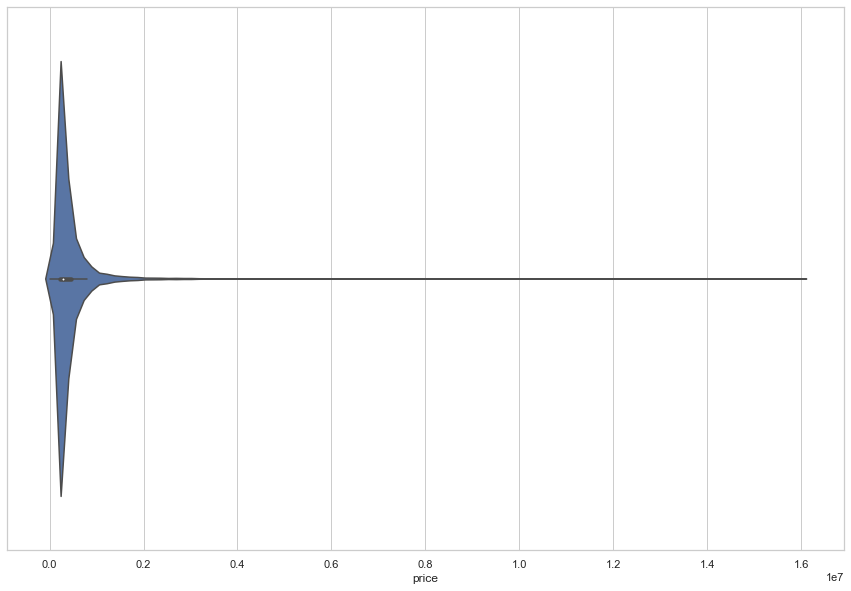

In [78]:
bx = seaborn.violinplot(x=hp["price"])

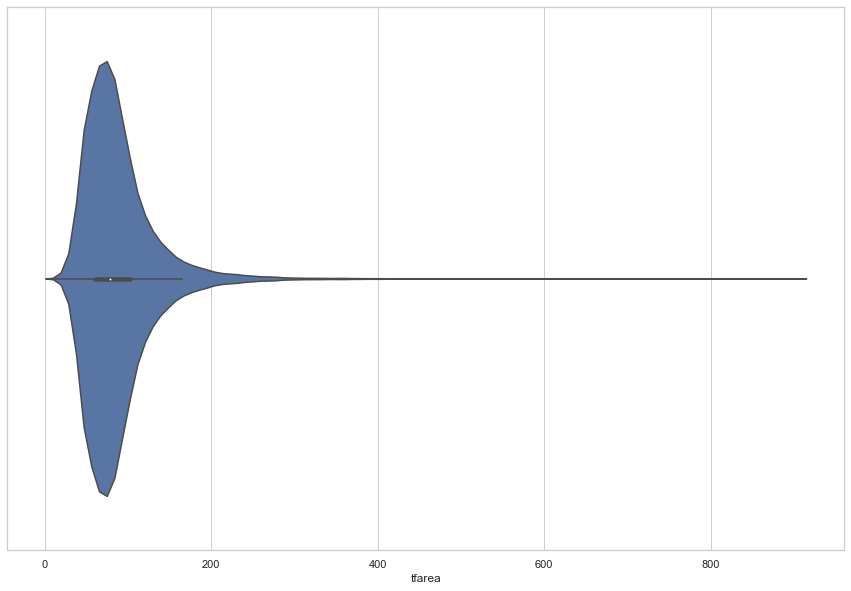

In [79]:
bx = seaborn.violinplot(x=(hp["tfarea"]))

As the violin plots show, both of these variables are quite right-skewed, so we'll take the natural log of both:

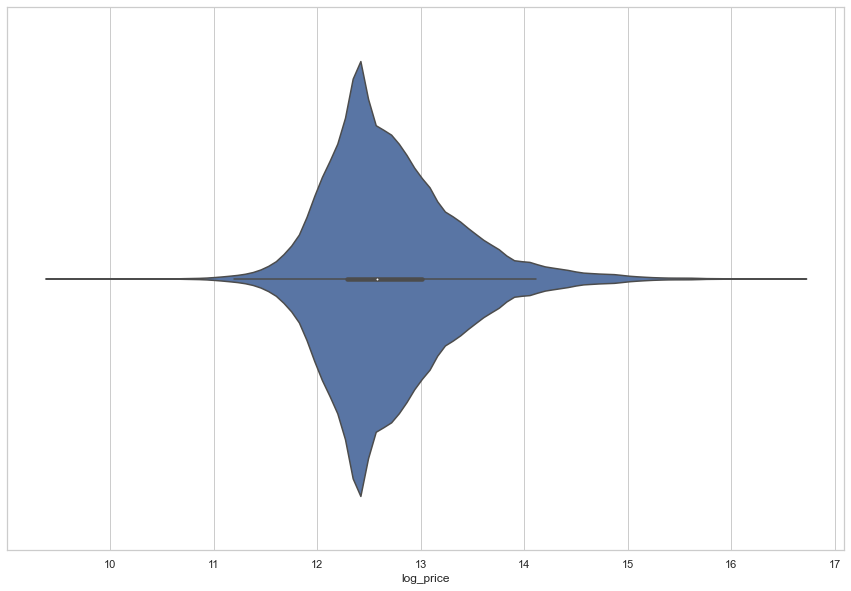

In [134]:
hp['log_area'] = np.log(hp['tfarea'])
hp['log_price'] = np.log(hp['price'])
bx = seaborn.violinplot(x=hp["log_price"])

Now, as you can see, the distribution of 'log_price' is much more conducive to a linear fit with other generally-normally-distributed variables. To run a regression in ```spreg``` we have to feed the function a vector of $Y$ and $X$ variables, so first we have to build a list of covariates:

In [81]:
variable_names = ['log_area', 'numberrooms', 'Flats', 'Detached','New']

Then we call the model and print the summary:

In [82]:
m1 = spreg.OLS(hp[['log_price']].values, hp[variable_names].values,
                name_y='log_price', name_x=variable_names, robust='white')
print(m1.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :           6
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71727
R-squared           :      0.4677
Adjusted R-squared  :      0.4677
Sum squared residual:   15458.531                F-statistic           :  12606.6256
Sigma-square        :       0.216                Prob(F-statistic)     :           0
S.E. of regression  :       0.464                Log likelihood        :  -46737.177
Sigma-square ML     :       0.216                Akaike info criterion :   93486.354
S.E of regression ML:      0.4642                Schwarz criterion     :   93541.438

White Standard Errors
-------------------------------------------------------

The standard regression output in ```spreg``` gives us a lot of information, so let's take a minute to examine it. 
### Summary of Output: Top Section
On the top we have some indictors of model fit, including the R-squared, which tells us the % of overall variance in $Y$ explained by the covariates that we included in this model. 0.4677 is generally pretty high - right off the bat that tell sus that we explained almost half of the total variance in housing prices just by including information on the type and size of the house and the number of rooms. Adjusted R-squared discounts the raw R-squared by taking into account the number of variables (because models with more covariates tend to have higher R-squareds simply as a by-product of having more information included to make a prediction), and is generally the one to use when evaluating models. We can also see the number of observations ($N$) and degrees of freedom (values that are free to vary in the calculation of the model, i.e., if you have as many independent variables as observations, your model estimates will be biased).
### Summary of Output: Middle Section
Next we can look at the coefficient values, which are the slopes of the regression line that the model calculated for each of the covariates that we included. As a note: the UCLA Institute for Digital Research and Education (IDRE) has a lot of great guides for understanding basic parameters of statistical models, so feel free to read through (or search for) articles related to understanding the basics of regression models. Since our dependent variable is logged, the coefficients of this model can be a little difficult to interpret. For a typical continuous variable in any regression model - like 'numberrooms' - the coefficient can be interpreted as the change (positive or negative) in the *dependent variable* expected based on a one-unit change in the independent variable. However, since our dependent variable is logged, the interpretation changes a bit: first we have to exponentiate the coefficient (i.e., take the inverse of the natural log); this value (centered on 1) is the *percent change in the geometric mean* of the dependent variable that we would expect form a one-unit increase in the independent variable. Subtracting 1 from the exponentiated coefficient helps our interpretation. Let's look at the 'numberrooms' example:

In [83]:
np.exp(0.0379068) - 1

0.03863442763878777

So based on our model, we can expect a 3.86% increase in housing price for every additional room that we add to a house, *holding all other characteristics constant* (because these are partial correlations). This is pretty useful information! The interpretation is pretty similar for a dummy variable like 'Flats' - just keep in mind that the % change in geometric mean is for flats (in this case) compared to all other housing categories (since the "1" dummy indicator is a one-unit change):

In [84]:
np.exp(0.2669421) - 1

0.30596482877796105

So, we're predicting a 30.6% higher (geometric average) housing price for flats compared to all other types, holding the other factors in the model constant. The final piece is how to interpret the coefficient on an independent variable in a model where the dependent variable is also logged (called an "elasticity"). Because these are both expressed in terms of % change, we have to specify the % increase in the independent variable that we are interested in observing change - let's say we're interested in what happens to housing price with a 10% increase in house size ('tfarea'). We take that 10% expressed as 1.10 and raise it to the coefficient value to find the value (centered on 1) of the percent change in the geometric mean of the dependent variable that we would expect form a 10% increase in the independent variable:

In [85]:
(1.1)**1.0176671 - 1 # We expect a 3.3% increase in housing price when housing size increases by 10%

0.10185380025229418

So we expect to see a 10.2% increase in housing price for every 10% increase in housing size. 

The last piece of information that we should extract from the middle section of the report are the "t-Statistic" and "probability" columns. The t-value (used, as opposed to a $z$-score, when we don't know the population mean or standard deviation, as is the case in most empirical regression analysis) is a measure of the ratio of "signal" to "noise", i.e., the difference between the estimated regression coefficient and 0 (being the null hypothesis in a situation where we don't know the "true" coefficient) - the "signal" - divided by the standard error of the coefficient (essentially a measure of the coefficient's variation) - the "noise". We can find this simply by dividing the estimated coefficient (because the null hypothesis is 0) by the standard error for, e.g., 'log_area':

In [86]:
1.0176671/0.0094878

107.26059782035878

The idea is to provide a number associated with how confident we are that this coefficient value is different than 0. If the coefficient is very large but the error around the estimate is also large (i.e., we have a large estimate but it varies a lot from case to case), then we will have low confidence that the predicted coefficient is different than 0 (thus a low $t$-value). In that way, the significance of your coefficient estimate is a function of 1) actual effect of the independent variable, 2) variation in the relationship of the independent variable to the dependent variable, and 3) the sample size. A large $t$-value corresponds to a small probability ($p$-value) that the coefficient is equal to 0 (the null hypothesis); basically, the $p$-value is a comparison the $t$-value to the *Student's t distribution* to determine what % of values are "more extreme" than the estimated $t$-value. This varies by degrees of freedom in the model - with three degrees of freedom, a $t$-value of 10.215 is more extreme that 0.999% of values in the distribution (and thus would have a corresponding $p$-value of .001); but as degrees of freedom (i.e., sample size) increase, $t$-value threshold for given critical values also decreases. With large samples, $t$-values of 2.326 are more extreme than 0.99% of values in the Student's $t$ distribution.

OK, so what does it all mean? Generally you want to set a critical $p$-value for rejecting/not rejecting the null hypothesis before you run your regression - the most common value is 0.05, but there are good reasons to select higher or lower values, depending on your data (critically, on your sample size). The $p$-value, then, is an estimate of the probability that the model's regression coefficient is not actually different than 0. If it is below the set threshold, we talk about the coefficient being a "statistically-significant" predictor of $Y$, but there are again good reasons to take $p$-values with a grain of salt and use more nuanced terms such as "interesting" values, or to discuss "high confidence" that the result is significant, etc. In our case - in this specification, at least - every variable seems to be highly-significant for predicting variation in housing price.

### Summary of Output: Bottom Section
Finally, at the bottom of the report we have the results of several diagnostic tests. The ```MULTICOLLINEARITY CONDITION NUMBER``` is a test of the collinearity between covariates - generally 45.585 is quite a high value, but this is also to be expected based on the framework of the hedonic model (number of rooms will tend to be highly-correlated with house size, for instance). While multicollinearity in the predictors can bias the coefficient estimates, cause swings in positive/negative signs, and create significant difficulties in interpretation (if two variables are almost entirely correlated, what does it mean for one coefficient to represent variation in $Y$ *holding constant* almost all of its own variation that is embodied in the other collinear variable?), the problem also has to be weighed against "ommitted variable bias" which occurs when important predictors of $Y$ are left out of the model entirely. In our case, given the well-established nature of the hedonic model, we will sit tight with our multicollinearity condition value and observe if it swings up wildly from here with additional covariates. The ```Jarque-Bera``` statistics provides a test on the normality of errors of our model - in this case it is highly-significant, meaning that the errors are significantly *not* normally-distributed. Since we have already logged a few of our variables to provide a more linear fit, the next step is to include additional factors - including spatial variables - that might improve the normality of the model errors. And finally, the ```Breusch-Pagan``` and ```Koenker-Bassett``` statistics test for heteroskedasticity. Again, in this case, both are significant, which indicates that the use of the ```robust='white``` parameter in the ```spreg``` call to use White's robust standard errors is justified. While these values remain significant, unfortunately ```spreg``` does not include additional options for standard error correction, and we will have to be content with watching the value of these test statistics themselves increase or decrease with future specifications.

## Spatial Structure
One way to interrogate these model diagnostics - and particularly the non-normality of the errors - further is to try to understand if spatial structure is playing a hidden role in determining variation in $Y$. In our current specification, we haven't included any information about neighborhood or any of the contextual urban factors that play a significant role in determining property values (a beautiful, new, gigantic mansion located next to an industrial site that pollutes the air will not be worth the same as it would be in a quiet residential neighborhood).

One way to examine this (and to help explain the non-normality of the model errors) is to look at clustering in the model errors by neighborhood. To do this, let's spatially join the 2011 housing points to the Output Areas (in which I have embedded the name of the borough that each Output Area is located within):

In [87]:
hp2 = gpd.sjoin(hp,oa)
pd.set_option('display.max_columns', None)
hp2.head()

,index,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,numberrooms,priceper,pcd,pcd2,dointr,doterm,ID,Dist_Road,Dist_Transit,Dist_OpenSpace,nearest_school_distance,geometry,Detached,Flats,New,log_area,log_price,index_right,geo_code,label,NAME_2,POP,POPDENS,HH,HECTARES,DEPRHH,EMPRES,STUDENT,PROFSCI,Trees,TreeDens
0,2,CR53EZ,1000000.0,2011-12-22,D,Y,F,A,A,2011.0,302.00,9.0,3311.258278,CR5 3EZ,CR5 3EZ,201107.0,NaN,3,310.9087078390314,1273.505462,531.854940,940.684187,POINT (528925.000 157964.000),1,0,1,5.710427,13.815511,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849
14373,132454,CR53ED,950000.0,2011-11-29,D,N,F,A,A,2011.0,264.75,10.0,3588.290840,CR5 3ED,CR5 3ED,199007.0,NaN,132455,391.9983923256881,1183.977889,559.912286,995.406297,POINT (528806.000 157882.000),1,0,0,5.578786,13.764217,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849
14441,133134,CR53ER,555000.0,2011-01-20,D,N,F,A,A,2011.0,185.00,7.0,3000.000000,CR5 3ER,CR5 3ER,199308.0,NaN,133135,42.01314846845171,1483.402493,649.963477,647.657380,POINT (529126.000 157740.000),1,0,0,5.220356,13.226723,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849
14944,138724,CR53EH,495000.0,2011-11-17,D,N,F,A,A,2011.0,191.19,8.0,2589.047544,CR5 3EH,CR5 3EH,199007.0,NaN,138725,127.7245807778461,1327.320045,585.743002,781.573633,POINT (529109.000 157935.000),1,0,0,5.253268,13.112313,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849
15030,139620,CR53QA,405000.0,2011-09-23,D,N,F,A,A,2011.0,63.96,5.0,6332.082552,CR5 3QA,CR5 3QA,199007.0,NaN,139621,247.9782101753372,1288.842874,525.809125,922.081836,POINT (529024.000 158049.000),1,0,0,4.158258,12.911642,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849


And then plot the distribution of residuals by borough:

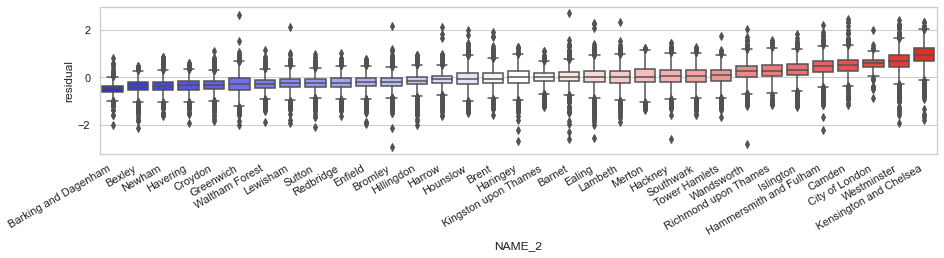

In [88]:
hp2['residual'] = m1.u
medians = hp2.groupby("NAME_2").residual.median().to_frame('hood_residual')

f = plt.figure(figsize=(15,3))
ax = plt.gca()
seaborn.boxplot('NAME_2', 'residual', ax = ax,
                data=hp2.merge(medians, how='left',
                              left_on='NAME_2',
                              right_index=True)
                   .sort_values('hood_residual'), palette='bwr')
f.autofmt_xdate()
plt.show()

As you can see, there is significant variation in how the model is working by neighborhood! Neighborhoods on the left of the scale have consistently lower observed values of housing price than the model would predict based on their raw housing characteristics (i.e., negative residuals), and neighborhoods on the right have consistently higher values than the model would predict (i.e., positive residuals). Why might that be? It appears that a lot of the boroughs on the high and low end of the residual spectrum are close to one another in space. We can test this explicitly by creating a __distance-based spatial weights matrix__ and generating spatial lags of the residuals:

In [89]:
w = weights.DistanceBand.from_dataframe(hp2, 500) # Weights based on features within 500 meters

And then correlating these spatially-lagged residuals with the residuals of the model in their origin locations:

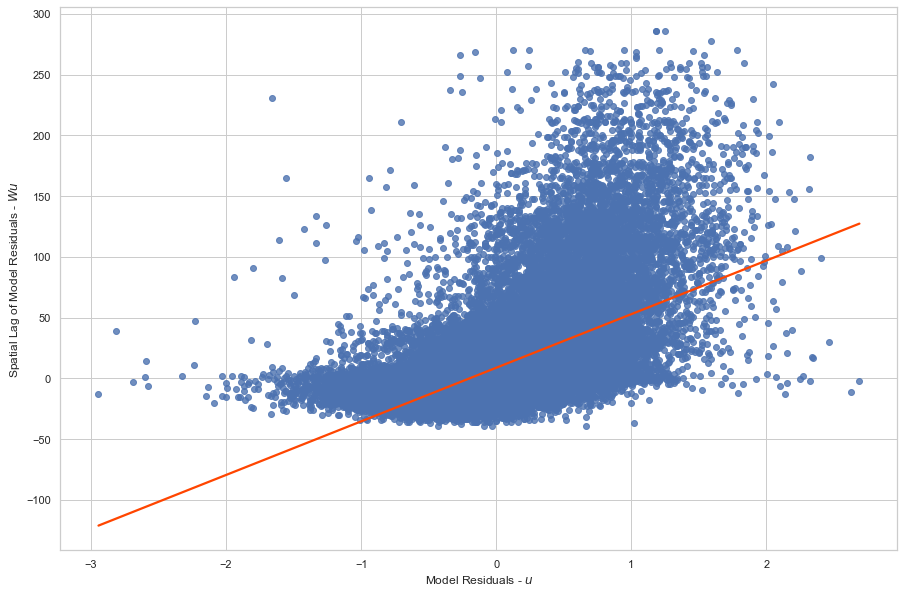

In [90]:
lag_residual = weights.spatial_lag.lag_spatial(w, m1.u)
ax = seaborn.regplot(m1.u.flatten(), lag_residual.flatten(), 
                     line_kws=dict(color='orangered'),
                     ci=None)
ax.set_xlabel('Model Residuals - $u$')
ax.set_ylabel('Spatial Lag of Model Residuals - $W u$');

As you have probably ascertained, this is basically a Moran's $I$ plot of the model residuals, and we can see from the regression line here that there is a pretty large positive correlation between the residuals of the model in a given point and the residuals of the model in its neighbors. Thus we can see pretty clearly that the prediction errors are clustering! Not only is this a violation of the core OLS assumption, but it can also perhaps help us infer that there are spatial processes structuring the relationship of the variables we've chosen to housing price.

We can even plot a local Moran's $I$ map of local outliers of prediction error. Here, red points correspond to "high-high" spatial clusters of positive residuals, while blue points correspond to "low-low" spatial clusters of negative residuals:

In [91]:
# outliers = esda.moran.Moran_Local(m1.u, w, permutations=999)
# error_clusters = (outliers.q % 2 == 1) # only the cluster cores
# error_clusters &= (outliers.p_sim <= .001) # filtering out non-significant clusters
# f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
# hp2.assign(error_clusters = error_clusters,
#           local_I = outliers.Is)\
#   .query("error_clusters")\
#   .sort_values('local_I')\
#   .to_crs('EPSG:3857').plot('local_I', cmap='bwr', marker='.', ax=ax)
# ax.set_title("Local Moran's I Hotpsots of Under- and Over-Prediction")
# ax.set_axis_off() #Remove axes from plot 
# plt.axis('equal') #Set x and y axes to be equal size
# cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

And now we see that there is a really consistent geography to the pattern of over- and under-prediction!

### Spatial Heterogeneity and Fixed Effects
Without a pre-conceived notion of what might be structuring these errors, one way to better control for the heterogenous relationships between the predictor variables and housing price by neighborhood is just to insert dummy variables for each borough directly in the regression model as 'fixed effects'. These fixed effects then control for all of the unobserved variation (outside of the other covariates) associated with each borough, and can be a very useful way to observe heterogeneity in relationships across space. To do this, we'll use ```statsmodels``` to build the equation, because we're using non-spatial regressions and it has an easier interface in which to enter the equation directly (you may have to install this package in the terminal if you don't have it already). First we build the equation:

In [92]:
f = 'log_price ~ ' + ' + '.join(variable_names) + ' + NAME_2 - 1' # Remove intercept (-1) in this fixed effects model
print(f)

log_price ~ log_area + numberrooms + Flats + Detached + New + NAME_2 - 1


Then we run it and observe the summary:

In [93]:
m2 = sm.ols(f, data=hp2).fit()
print(m2.summary2())

                        Results: Ordinary least squares
Model:                  OLS                  Adj. R-squared:         0.752     
Dependent Variable:     log_price            AIC:                    38196.3900
Date:                   2022-05-11 17:49     BIC:                    38544.9184
No. Observations:       71097                Log-Likelihood:         -19060.   
Df Model:               37                   F-statistic:            5828.     
Df Residuals:           71059                Prob (F-statistic):     0.00      
R-squared:              0.752                Scale:                  0.10014   
-------------------------------------------------------------------------------
                                Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-------------------------------------------------------------------------------
NAME_2[Barking and Dagenham]    8.5450   0.0210 406.6309 0.0000  8.5038  8.5862
NAME_2[Barnet]                  9.1532   0.0202 453.4906 0.0000 

The structure of the summary is a little different, but most elements should be easy to recognize. Most importantly, we see that the adjusted R-squared has risen significantly, and each of the fixed effects is a significant predictor of housing price above and beyond the characteristics of the houses themselves. We can also see that the sign on the 'Flats' variable has switched - now that we're taking neigborhood into account, a flat is less valuable (on average) than other types of housing. This makes some sense - most flats are probably located in the city center, which was driving their significance in the previous models; if we were to take out the advantages of city center neighborhoods, most people would probably prefer to live in a detached house rather than a flat (even at the same size, etc.) because it affords more privacy, etc.

To get a better sense of the variation in neighborhood effects, we can actually extract them from the model outputs:

In [94]:
neighborhood_effects = m2.params.filter(like='NAME_2')
neighborhood_effects.head()

NAME_2[Barking and Dagenham]    8.545000
NAME_2[Barnet]                  9.153167
NAME_2[Bexley]                  8.653961
NAME_2[Brent]                   9.118544
NAME_2[Bromley]                 8.874468
dtype: float64

Strip off the coefficient naming convention from the table, and put them into a dataframe:

In [95]:
stripped = neighborhood_effects.index.str.strip('NAME_2[').str.strip(']')
neighborhood_effects.index = stripped
neighborhood_effects = neighborhood_effects.to_frame('fixed_effect')
neighborhood_effects.head()

,fixed_effect
Barking and Dagenham,8.545000
Barnet,9.153167
Bexley,8.653961
Brent,9.118544
Bromley,8.874468


And then create a new "NAME" column that we can use to join back to the boroughs GeoJSON file in order to map the fixed effects:

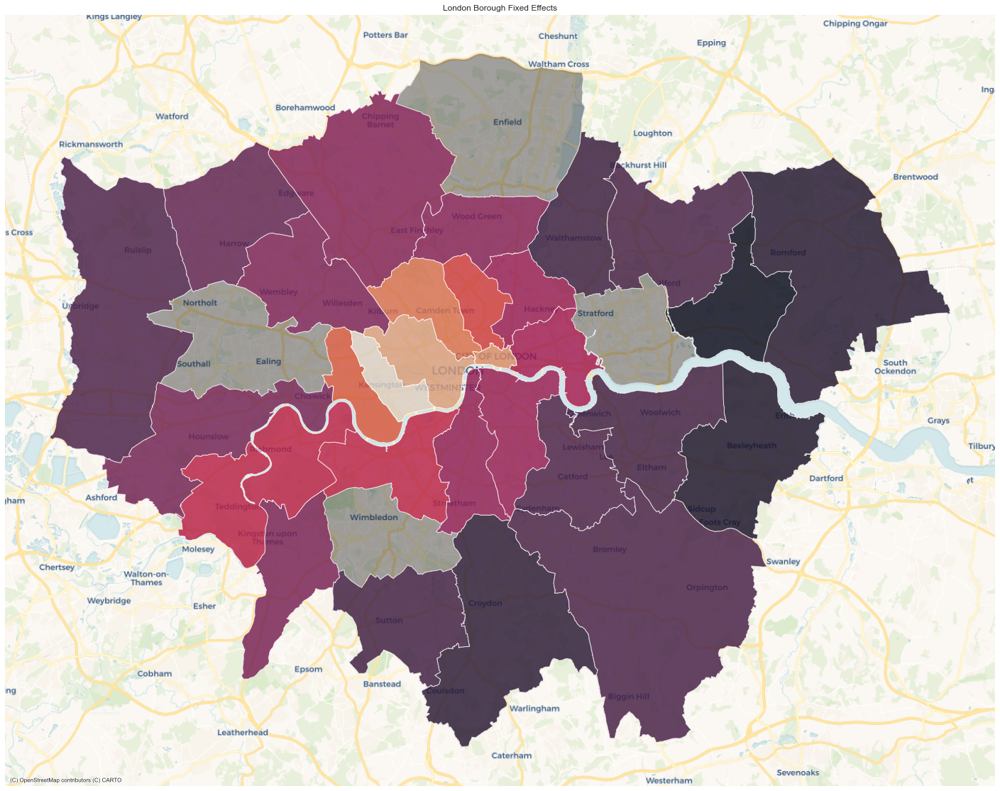

In [96]:
neighborhood_effects['NAME'] = neighborhood_effects.index
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
lb.to_crs('EPSG:3857').plot(ax=ax, color='k', alpha=0.4)
lb.merge(neighborhood_effects, how='left',
                    left_on='NAME', 
                    right_on='NAME')\
                  .dropna(subset=['fixed_effect'])\
                  .to_crs('EPSG:3857').plot('fixed_effect',
                        ax=ax, alpha=.7)
ax.set_title("London Borough Fixed Effects")
ax.set_axis_off() #Remove axes from plot 
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

This is very interesting, and we can see that there clearly is value in illustrating the heterogeneity in average house price by neighborhood (even when controlling for the characteristics of the houses themselves). However, these fixed effects don't help us to generalize the results very much, i.e., as social scientists we are probably much more interested in finding out *what about these neighborhoods* is making them so much more attractive, rather than just identifying the fact that some neighborhoods are more attractive than others.
### Spatial Feature Engineering
One way to do this is to engineer some spatial features by directly calculating proximity to various features that we might think are structuring the data systematically. In the case of house prices, distance to the center of London is a valuable - if still relatively general - continuous spatial feature that captures a lot of the economic (i.e., commuting), cultural, and social benefits of being located in the "center of the action." In ```GeoPandas``` we can directly calculate the minimum distance from a spatial layer to the closest feature in another layer using the ```geometry.apply``` function:

In [97]:
hp_0km = hp2.geometry.apply(lambda x: KM0.distance(x).min()) #KM0 = the central point of London near Trafalgar square
hp_0km.head()

0        22442.160157
14373    22530.237359
14441    22656.936031
14944    22462.788624
15030    22352.568686
Name: geometry, dtype: float64

Then we join this table of distances back to our 2011 housing points:

In [98]:
hp_0km_2 = pd.merge(hp2, hp_0km, left_index=True, right_index=True)
hp_0km_3 = hp_0km_2.rename(index=str, columns={"geometry_y":"Dist_0KM", "geometry_x":"geometry"})
hp_0km_3.head()

,index,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,numberrooms,priceper,pcd,pcd2,dointr,doterm,ID,Dist_Road,Dist_Transit,Dist_OpenSpace,nearest_school_distance,geometry,Detached,Flats,New,log_area,log_price,index_right,geo_code,label,NAME_2,POP,POPDENS,HH,HECTARES,DEPRHH,EMPRES,STUDENT,PROFSCI,Trees,TreeDens,residual,Dist_0KM
0,2,CR53EZ,1000000.0,2011-12-22,D,Y,F,A,A,2011.0,302.00,9.0,3311.258278,CR5 3EZ,CR5 3EZ,201107.0,NaN,3,310.9087078390314,1273.505462,531.854940,940.684187,POINT (528925.000 157964.000),1,0,1,5.710427,13.815511,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849,-0.460929,22442.160157
14373,132454,CR53ED,950000.0,2011-11-29,D,N,F,A,A,2011.0,264.75,10.0,3588.290840,CR5 3ED,CR5 3ED,199007.0,NaN,132455,391.9983923256881,1183.977889,559.912286,995.406297,POINT (528806.000 157882.000),1,0,0,5.578786,13.764217,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849,0.706921,22530.237359
14441,133134,CR53ER,555000.0,2011-01-20,D,N,F,A,A,2011.0,185.00,7.0,3000.000000,CR5 3ER,CR5 3ER,199308.0,NaN,133135,42.01314846845171,1483.402493,649.963477,647.657380,POINT (529126.000 157740.000),1,0,0,5.220356,13.226723,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849,0.682601,22656.936031
14944,138724,CR53EH,495000.0,2011-11-17,D,N,F,A,A,2011.0,191.19,8.0,2589.047544,CR5 3EH,CR5 3EH,199007.0,NaN,138725,127.7245807778461,1327.320045,585.743002,781.573633,POINT (529109.000 157935.000),1,0,0,5.253268,13.112313,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849,0.391566,22462.788624
15030,139620,CR53QA,405000.0,2011-09-23,D,N,F,A,A,2011.0,63.96,5.0,6332.082552,CR5 3QA,CR5 3QA,199007.0,NaN,139621,247.9782101753372,1288.842874,525.809125,922.081836,POINT (529024.000 158049.000),1,0,0,4.158258,12.911642,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849,0.568339,22352.568686


And map it:

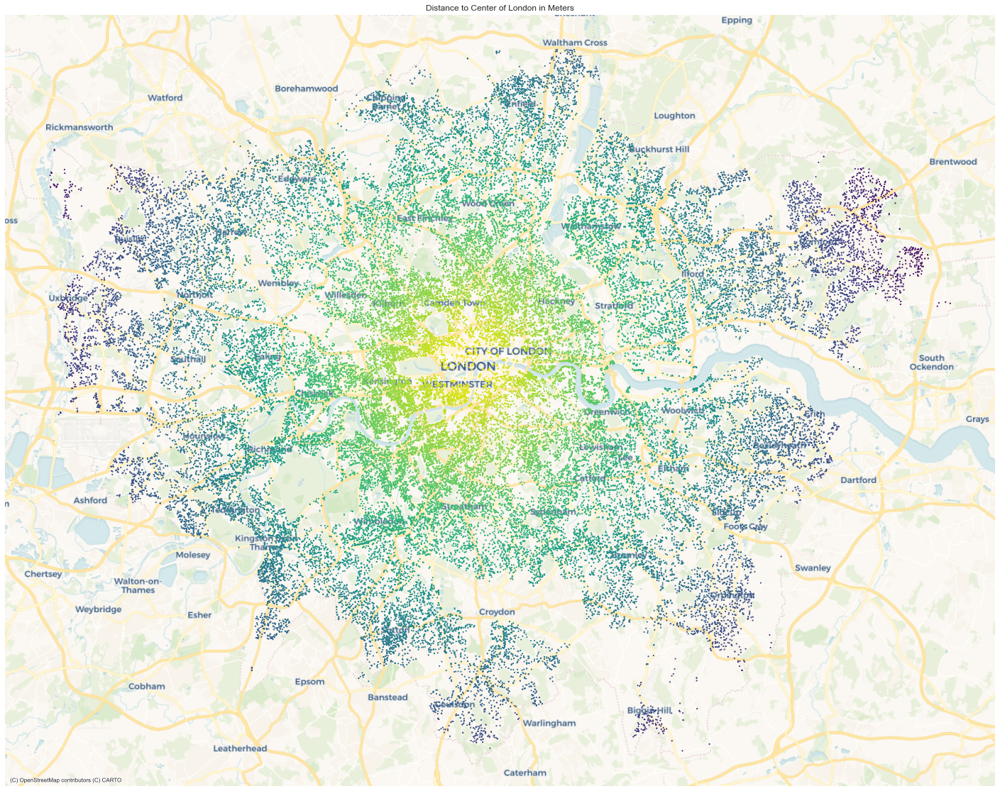

In [99]:
color_map = plt.cm.get_cmap('viridis')
reversed_color_map = color_map.reversed()
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
hp_0km_3.to_crs('EPSG:3857').plot('Dist_0KM', cmap=reversed_color_map, marker='.', s=5, ax=ax)
ax.set_axis_off() #Remove axes from plot 
ax.set_title('Distance to Center of London in Meters') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

Compare this to the maps of neighborhood fixed effects and spatial hotspots of model residuals above - it certainly seems that distance to city center might be an important variable structuring the pattern in housing price! Let's see how it behaves when we insert in into the original model specification:

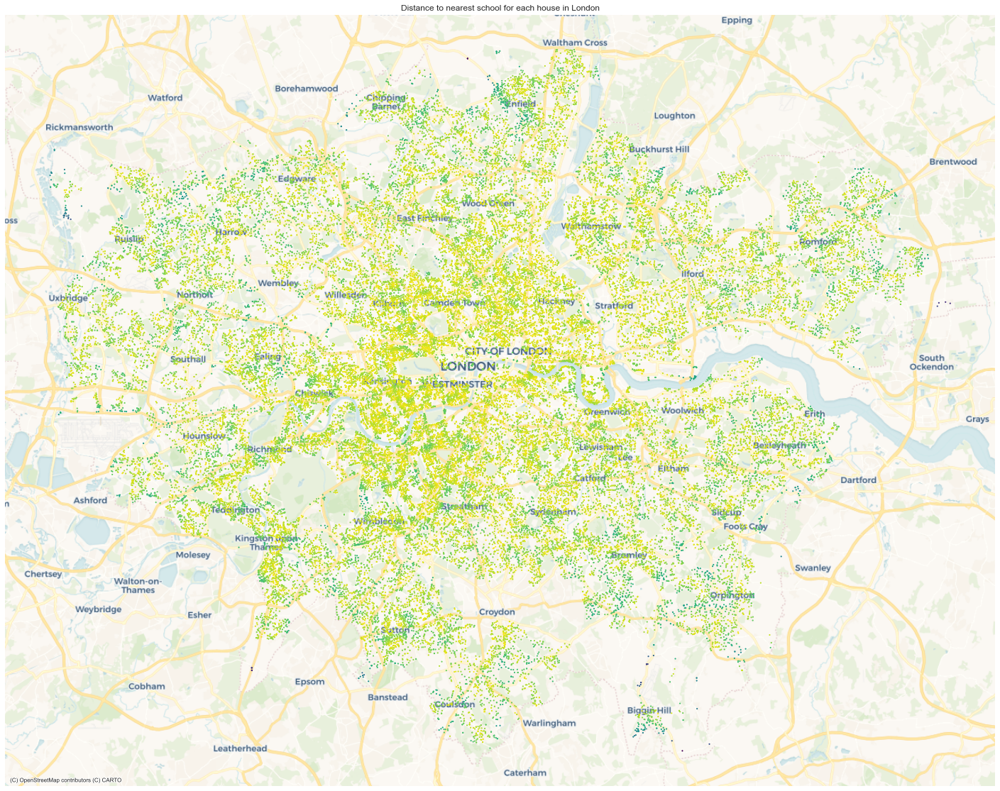

In [114]:
color_map = plt.cm.get_cmap('viridis')
reversed_color_map = color_map.reversed()
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
hp_0km_3.to_crs('EPSG:3857').plot('nearest_school_distance', cmap=reversed_color_map, marker='.', s=5, ax=ax)
ax.set_axis_off() #Remove axes from plot 
ax.set_title('Distance to nearest school for each house in London') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

We see that schools are closer to houses near city centre than outskirts. However, there is no clear differentiation

In [100]:
base_names = variable_names
dist_names = variable_names + ['Dist_0KM']

In [101]:
m3 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[dist_names].values,
                name_y='log_price', name_x=dist_names, robust='white')
print(m3.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :           7
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71726
R-squared           :      0.6352
Adjusted R-squared  :      0.6352
Sum squared residual:   10594.944                F-statistic           :  20815.4576
Sigma-square        :       0.148                Prob(F-statistic)     :           0
S.E. of regression  :       0.384                Log likelihood        :  -33187.383
Sigma-square ML     :       0.148                Akaike info criterion :   66388.765
S.E of regression ML:      0.3843                Schwarz criterion     :   66453.030

White Standard Errors
-------------------------------------------------------

Here it is highly-significant and (interestingly) pulls out the same negative effect for 'Flats' that we saw with the inclusion of neighborhood fixed effects, and we've also been able to explain a lot more variation in $Y$ (adjusted R-squared is now .6352). Let's check the spatial clustering of the model residuals, since our diagnostics still indicate significant lack of normality:

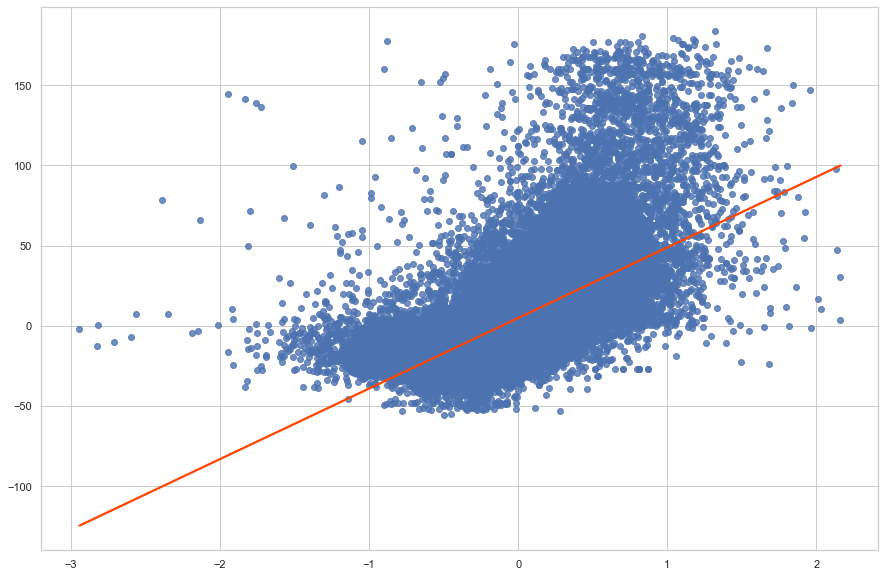

In [102]:
lag_residual = weights.spatial_lag.lag_spatial(w, m3.u)
seaborn.regplot(m3.u.flatten(), lag_residual.flatten(), 
                line_kws=dict(color='orangered'),
                ci=None);

Now we see a much more linear relationship, but still a very strong one. Clearly there is still a strong spatial pattern to the model predictions; large residuals in one unit tend to be surrounded by large residuals in its neighbors, and vice-versa. Let's include a few other features of interest to make the model specification really robust, including distance to __primary roads__, __transit stations__, and __open space__ that I pre-calculated earlier, as well as the % of households with at least one deprivation dimension ('DEPRHH'):

In [121]:
hp_0km_3["Dist_Road"] = pd.to_numeric(hp_0km_3["Dist_Road"])
all_names = dist_names + ["Dist_Road"] + ['Dist_Transit'] + ['Dist_OpenSpace'] + ['DEPRHH']
all_names

['log_area',
 'numberrooms',
 'Flats',
 'Detached',
 'New',
 'Dist_0KM',
 'Dist_Road',
 'Dist_Transit',
 'Dist_OpenSpace',
 'DEPRHH']

In [122]:
m4 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                name_y='log_price', name_x=all_names, robust='white')
print(m4.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :          11
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71722
R-squared           :      0.7109
Adjusted R-squared  :      0.7108
Sum squared residual:    8397.437                F-statistic           :  17633.5631
Sigma-square        :       0.117                Prob(F-statistic)     :           0
S.E. of regression  :       0.342                Log likelihood        :  -24850.203
Sigma-square ML     :       0.117                Akaike info criterion :   49722.406
S.E of regression ML:      0.3421                Schwarz criterion     :   49823.394

White Standard Errors
-------------------------------------------------------

We continue to improve the model fit, although we can see that the multicollinearity in our model is increasing pretty substantially as well. From an explanatory urban planning perspective, these new variables offer a lot of substantive interest: increasing distance to major roads increases average housing price (holding all other factors constant), meaning that *proximity* to major roads is a negative externality for housing price, as is the percentage of deprived households (a general indicator of socioeconomic status). On the other hand, proximity to transit stations and open spaces significantly increase average housing price.

Let's check back with clustering in the residuals:

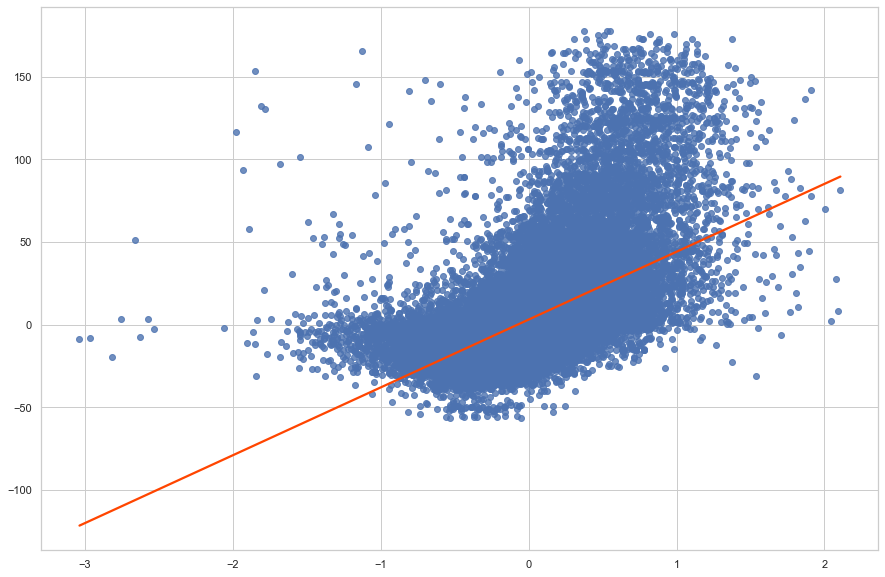

In [123]:
lag_residual = weights.spatial_lag.lag_spatial(w, m4.u)
seaborn.regplot(m4.u.flatten(), lag_residual.flatten(), 
                line_kws=dict(color='orangered'),
                ci=None);

# Adding in nearest school distance parameter

In [124]:

all_names = all_names + ["nearest_school_distance"]
all_names

['log_area',
 'numberrooms',
 'Flats',
 'Detached',
 'New',
 'Dist_0KM',
 'Dist_Road',
 'Dist_Transit',
 'Dist_OpenSpace',
 'DEPRHH',
 'nearest_school_distance']

In [125]:
m5 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                name_y='log_price', name_x=all_names, robust='white')
print(m5.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :          12
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71721
R-squared           :      0.7109
Adjusted R-squared  :      0.7108
Sum squared residual:    8397.420                F-statistic           :  16030.3336
Sigma-square        :       0.117                Prob(F-statistic)     :           0
S.E. of regression  :       0.342                Log likelihood        :  -24850.131
Sigma-square ML     :       0.117                Akaike info criterion :   49724.263
S.E of regression ML:      0.3421                Schwarz criterion     :   49834.431

White Standard Errors
-------------------------------------------------------

We continue to improve the model fit, although we can see that the multicollinearity in our model is increasing pretty substantially as well. From an explanatory urban planning perspective, these new variables offer a lot of substantive interest: increasing distance to major roads increases average housing price (holding all other factors constant), meaning that *proximity* to major roads is a negative externality for housing price, as is the percentage of deprived households (a general indicator of socioeconomic status). On the other hand, proximity to transit stations and open spaces significantly increase average housing price.

Let's check back with clustering in the residuals:

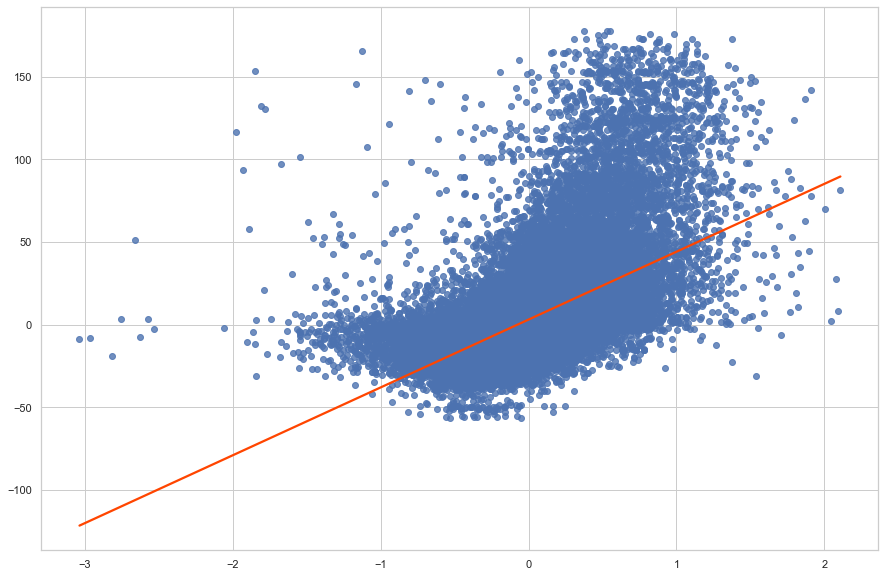

In [126]:
lag_residual = weights.spatial_lag.lag_spatial(w, m4.u)
seaborn.regplot(m5.u.flatten(), lag_residual.flatten(), 
                line_kws=dict(color='orangered'),
                ci=None);

We notice that school distance does not have any impact on the price of the house as p value is greater than 0.05

# Adding in the quadratic term to check if the relationship saturates after certain point

In [127]:
hp_0km_3["sq_nearest_school_distance"] = hp_0km_3["nearest_school_distance"]**2
all_names = all_names + ["sq_nearest_school_distance"]

In [128]:
m51 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                name_y='log_price', name_x=all_names, robust='white')
print(m51.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :          13
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71720
R-squared           :      0.7116
Adjusted R-squared  :      0.7115
Sum squared residual:    8376.729                F-statistic           :  14745.3276
Sigma-square        :       0.117                Prob(F-statistic)     :           0
S.E. of regression  :       0.342                Log likelihood        :  -24761.645
Sigma-square ML     :       0.117                Akaike info criterion :   49549.291
S.E of regression ML:      0.3417                Schwarz criterion     :   49668.640

White Standard Errors
-------------------------------------------------------

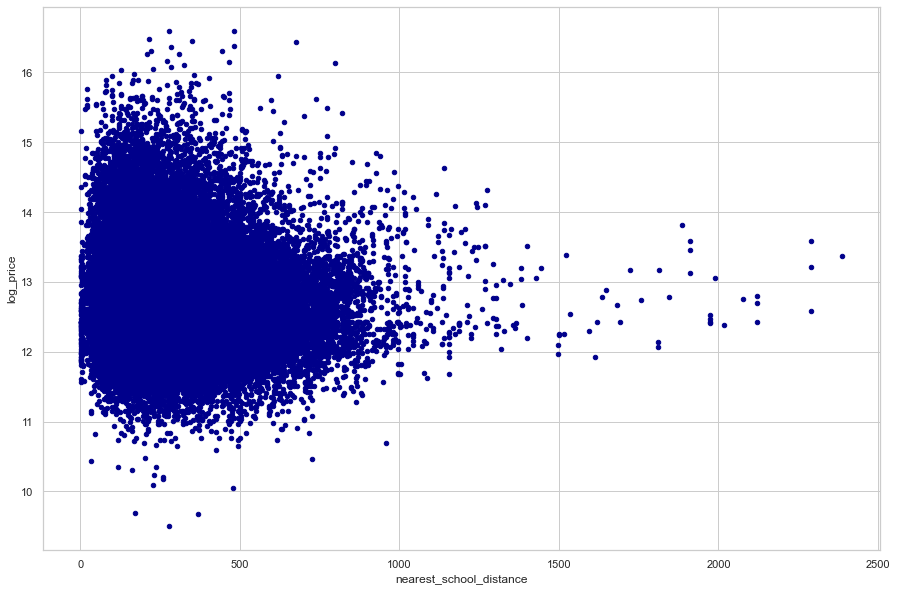

In [131]:
ax1 = hp_0km_3.plot.scatter(x='nearest_school_distance',
                       y='log_price',
                       c='DarkBlue')

scaling of variables

In [110]:
# Ended here

We still see signs of residual spatial structure in the residuals! As we have pretty much exhausted our non-spatial remedies at this point, it is likely time to employ an explicitly spatial regression specification.
## Spatial Regression Specifications
### Spatial Diagnostics
We can test the need for a spatial regression formally with several spatial regression diagnostics available in ```spreg```. If we provide the model with a spatial weights matrix ($w$), we can calculate the residual Moran's $I$ that we've been plotting here (which is an indicator of residual spatial error in the specification), as well as the robust Lagrange Multipliers for the spatial lag, spatial error, and spatial lag + error models:

In [111]:
m6 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                name_y='log_price', name_x=all_names, robust='white', w=w, spat_diag=True, moran=True)
print(m6.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :          12
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71721
R-squared           :      0.7109
Adjusted R-squared  :      0.7108
Sum squared residual:    8397.420                F-statistic           :  16030.3336
Sigma-square        :       0.117                Prob(F-statistic)     :           0
S.E. of regression  :       0.342                Log likelihood        :  -24850.131
Sigma-square ML     :       0.117                Akaike info criterion :   49724.263
S.E of regression ML:      0.3421                Schwarz criterion     :   49834.431

White Standard Errors
-------------------------------------------------------

All of our spatial diagnostic tests are highly-significant, which suggests that there is both significant spatial dependence and spatial error in the model specifications. While both may be present in a given model, [Anselin and Rey (2014)](https://www.amazon.com/Modern-Spatial-Econometrics-Practice-GeoDaSpace/dp/0986342106) suggest that usually one type of spatial dependence is predominant, so we'll estimate each of the basic spatial regression models in turn and compare the results.

### Spatial Lag of X Model (SLX)
The most striaghtforward way to introduce spatial dependence directly into the regression specification is to calculate and include the spatial lags of the $X$ variables in the basic regression framework:

$Y = X\beta + WX\gamma  +  \epsilon$

where $W$ is the spatial weights matrix and $\gamma$ is the set of spatial lag coefficients for the independent variables. This model can be estimated using OLS because the spatial lags don't violate any of the basic assumptions (as other spatial models do) - they are essentially additional exogenous variables. For this reason, we could also consider this model a kind of extension of the "spatial feature engineering" approach. 

Recall that the fundamental purpose of accounting for spatial dependence in our model is to try to understand how spatial structure plays a role in determining variation in $Y$. A very common way for this to occur is through spatial spillovers from the covariates - in our example, this might mean that the price of a given house is determined not only by the number of rooms of the house itself, but also by the average number of rooms in neighboring houses.

We can implement this model by using `PySAL`'s `lag_spatial` function and renaming with an added 'w_' as a prefix:

In [112]:
wx = hp_0km_3[variable_names].apply(
    lambda y: weights.spatial_lag.lag_spatial(w, y)
# Rename the spatial lag, adding w_ to the original name
).rename(
    columns=lambda c: 'w_'+c)
# Compute the spatial lag of each of those variables
wx

,w_log_area,w_numberrooms,w_Flats,w_Detached,w_New
0,34.796790,51.0,0.0,6.0,0.0
14373,25.620576,38.0,0.0,5.0,1.0
14441,39.976924,59.0,0.0,7.0,1.0
14944,39.662618,56.0,0.0,6.0,1.0
15030,40.757628,59.0,0.0,6.0,1.0
...,...,...,...,...,...
71666,485.323716,357.0,98.0,0.0,2.0
71667,656.211813,481.0,138.0,0.0,0.0
71670,806.527077,652.0,168.0,0.0,0.0
71702,664.296778,555.0,113.0,2.0,8.0


In [113]:
# Merge original variables with the spatial lags in `wx`
slx_exog = hp_0km_3[all_names].join(wx)
m7 = spreg.OLS(hp_0km_3[['log_price']].values, slx_exog.values,
                name_y='log_price', name_x=slx_exog.columns.tolist(), robust='white', w=w, spat_diag=True, moran=True)
print(m7.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :          17
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71716
R-squared           :      0.7559
Adjusted R-squared  :      0.7559
Sum squared residual:    7089.294                F-statistic           :  13880.5995
Sigma-square        :       0.099                Prob(F-statistic)     :           0
S.E. of regression  :       0.314                Log likelihood        :  -18776.539
Sigma-square ML     :       0.099                Akaike info criterion :   37587.079
S.E of regression ML:      0.3144                Schwarz criterion     :   37743.151

White Standard Errors
-------------------------------------------------------

Let's dive into these results in a little more depth. If we go back to our equation for the SLX model, we can see that $\beta$ describes the change in a particular unit's (let's subscript as $i$) $y$ ($y_{i}$) when $X_{ik}$ - *that unit's* value for explanatory variable $k$ increases by one. We call this the __direct effect__. $\gamma$, on the other hand, represents the __indirect effect__, which can be interpreted either as the change in $y_{i}$ when $X_{jk}$ increases by one (the neighbors of $i$ being designated here as $j$) or the change in $y_{j}$ when $X_{ik}$ increases by one show, average indirect impact *to* and *from* an obersvation are numerically equivalent). The interpretation depends largely on the veiwpoint of the research question.

You may have noticed that in this case we've only computed the spatial lags of the characteristics of the *houses themselves* rather than the spatial features. While these lags can also be computed, interpretation of these indirect effects is more difficult - what exactly would the change in $y_{i}$ when $X_{jDist_0KM}$ increases by one mean *after controlling for* the change in $y_{i}$ when $X_{iDist_0KM}$ increases by one? Since $i$ and $j$ are, by definition, near one another, 'w_Dist_0km' and 'Dist_0km' are likely to be so collinear as to render the interpretation meaningless (or highly difficult). 

Now, if we compare the results of the direct effects to our previous model, the significances and directions of effect all basically match, other than for 'Dist_Transit'. This suggests that some of the variance in $y$ explained by that variable may have been better explained by accounting for the characteristics of the houses in the neighborhood or may be moderated by these characteristics. In other words, it's possible that while being closer to transit is a raw benefit to house price overall, it has a *negative* effect on houses of higher quality. We can explore this relationship directly by making an interaction plot - here we're looking at the relationship between 'Dist_Transit' and $y$ for high (above median) and low (below median) values of 'w_Detached'